# Draw response matrix $K^{ij}$ and differentially for the particle level bin $l=$, i.e. $K^{ij}_l$. The kinematic observables are recoPt and recoNjets2p5.

### This notebook loads trained classifiers. It produces the closure plots and saves the histograms of the closure plots in form of matrices in .npy files. These files are used in the notebooks "EffectOfDifferentResponses" and "DiffXsecHistos" to  compute the response matrices without the need of loading the classifiers from scratch.

#### Load packages

In [1]:
import train as tn
#reload(tn)

import plotting
#reload(plotting)

import matplotlib.pyplot as plt
plt.style.use('seaborn-poster')
%matplotlib inline

import numpy as np

from pprint import pprint

import pandas as pd

import os
import json
import importlib

import util as ut
reload(ut)

import angles as ang
reload(ang)

Welcome to ROOTaaS 6.06/05


<module 'angles' from 'angles.pyc'>

#### name of the classifier:

In [2]:
classifier_name = '2clfs_AngGamJetGamGamClass_recoPt_WrongAlphaAngles'
classifier_name = '2clfs_IsoClass_recoPt'
classifier_name = '2clfs_Class_recoPt'
classifier_name = '2clfs_AngGamJetGamGamClass_AngGamGamDistRrecoPt'
classifier_name = '2clfs_AngGamJetGamGamClass_AngGamJetGamGamrecoPt'
classifier_name = '3clfs_Class_recoPt_AngJetJetrecoNjets'
classifier_name = '2clfs_Class_recoPt'
classifier_name = '2clfs_AngGamJetGamGamClass_AngGamGamDistRrecoPt'
classifier_name = '3clfs_AngGamJetGamGamJetJetClass_DistRrecoPt_DistR_recoNjets'
classifier_name = '3clfs_AngGamJetGamGamJetJetFullClass_recoPt_recoNjets'
classifier_name = '3clfs_AngGamJetGamGamJetJetClass_AngGamJetGamGamJetJetrecoPt_AngGamJetGamGamJetJetrecoNjets'
classifier_name = '2clfs_AngGamJetGamGamJetJetClass_AntiKTrecoNjets'
classifier_name = '3clfs_ggF_CUETP8M1Up'
classifier_name = '3clfs_ggF_DownPS'
classifier_name = '3clfs_ggF_UpPS'
classifier_name = '3clfs_ggF_powheg'
classifier_name = '3clfs_VBF_CUETP8M1Down'
classifier_name = '3clfs_VBF_CUETP8M1Up'
classifier_name = '3clfs_VBF_DownPS'
classifier_name = '3clfs_VBF_UpPS'
classifier_name = '3clfs_VBF_powheg'
classifier_name = '3clfs'
classifier_name = '3clfs_AngGamJetGamGamJetJetClass_AngGamJetGamGamJetJetrecoPt_AngGamJetGamGamJetJetrecoNjets'
classifier_name = '3clfs_Unbroken'
classifier_name = '1clfsIso_Pasq'
classifier_name = 'classPtEta'
classifier_name = '1clfPtOnly_Pasq'
classifier_name = '1clfs_Pasq'
classifier_name = '3clfs_1stTestwithAngles'
classifier_name = '2clfs_fullInfo_recoNjets'
classifier_name = '2clfs_lowergenJetPtcut' # this is wrong haven't included pt as features
classifier_name = 'pt20GeVcut'



classifier_name = '3clfs'
classifier_name = 'pt20GeVcut'
classifier_name = '3clfs_AngGamJetGamGamJetJetClass_AngGamJetGamGamJetJetrecoPt_AngGamJetGamGamJetJetrecoNjets'
classifier_name = '3clfs_std'







#### list of observables: (class corresponds to the inclusive) 

In [ ]:
class_list = ['class','recoPt','recoNjets2p5']

In [3]:
ut.defaultParameters(dataDir="/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/data", 
                     load = True,
                     inputName = classifier_name, 
                     inputDir = '/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/classifiers',
                    dataFiles=[(0,'output_GluGluHToGG_M125_IA.root'),                   
                                (1,'output_ttHToGG_M125_IA.root'),                     
                                (2,'output_VBFHToGG_M125_IA.root'),                            
                                (3,'output_VHToGG_M125_IA.root'),
                               ]
                    )

# !!!
# It is very important that the genBranches specified in the next cell agree with the ones set for the training. Otherwise the samples are shuffeled at the end of the loading phase and this would introduce a problem because the first set of samples are used for testing and the second part for the training and we do not want them to get mixed and evaluate the BDT on samples used for training.

In [4]:
ut.setParams()
# manual fix in order that the json file doesn't overwrite inputDir
#ut.params['inputDir'] = "/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/classifiers"


#genBr = ang.AppendGenJetVariableNames(['genPt','genRapidity','weight','puweight',
#                            'genNjets2p5','genLeadGenIso','genSubleadGenIso'])  
#genBr = ang.AppendPhotonVariableNames(genBr)                                       
#ut.params['genBranches'] = genBr

ut.params['genBranches'] =['genPt', 'genRapidity', 'genJet2p5Pt0', 'genJet2p5Pt1', 'genJet2p5Pt2', 
                           'genJet2p5Pt3', 'genJet2p5Pt4', 'genJet2p5Pt5', 'genJet2p5Rapidity0', 
                           'genJet2p5Rapidity1', 'genJet2p5Rapidity2', 'genJet2p5Rapidity3', 
                           'genJet2p5Rapidity4', 'genJet2p5Rapidity5', 'weight', 'genNjets2p5', 
                           'genLeadGenIso', 'genSubleadGenIso', 'genJet2p5pt20Pt0', 'genJet2p5pt20Rapidity0', 
                           'genJet2p5pt20Pt1', 'genJet2p5pt20Rapidity1', 'genJet2p5pt20Pt2',
                           'genJet2p5pt20Rapidity2', 'genJet2p5pt20Pt3', 'genJet2p5pt20Rapidity3', 
                           'genJet2p5pt20Pt4', 'genJet2p5pt20Rapidity4', 'genJet2p5pt20Pt5', 
                           'genJet2p5pt20Rapidity5', 'genAbsCosDeltaAlpha2p5pt2001', 'genAbsCosDeltaAlpha2p5pt2002',
                           'genAbsCosDeltaAlpha2p5pt2003', 'genAbsCosDeltaAlpha2p5pt2004', 
                           'genAbsCosDeltaAlpha2p5pt2005', 'genAbsCosDeltaAlpha2p5pt2012',
                           'genAbsCosDeltaAlpha2p5pt2013', 'genAbsCosDeltaAlpha2p5pt2014', 
                           'genAbsCosDeltaAlpha2p5pt2015', 'genAbsCosDeltaAlpha2p5pt2023', 
                           'genAbsCosDeltaAlpha2p5pt2024', 'genAbsCosDeltaAlpha2p5pt2025', 
                           'genAbsCosDeltaAlpha2p5pt2034', 'genAbsCosDeltaAlpha2p5pt2035', 
                           'genAbsCosDeltaAlpha2p5pt2045', 'genAbsCosDeltaPhi2p5pt2001',
                           'genAbsCosDeltaPhi2p5pt2002', 'genAbsCosDeltaPhi2p5pt2003', 
                           'genAbsCosDeltaPhi2p5pt2004', 'genAbsCosDeltaPhi2p5pt2005', 
                           'genAbsCosDeltaPhi2p5pt2012', 'genAbsCosDeltaPhi2p5pt2013', 
                           'genAbsCosDeltaPhi2p5pt2014', 'genAbsCosDeltaPhi2p5pt2015', 
                           'genAbsCosDeltaPhi2p5pt2023', 'genAbsCosDeltaPhi2p5pt2024', 
                           'genAbsCosDeltaPhi2p5pt2025', 'genAbsCosDeltaPhi2p5pt2034',
                           'genAbsCosDeltaPhi2p5pt2035', 'genAbsCosDeltaPhi2p5pt2045']


ut.params['genBranches'] = ['genPt', 'genRapidity', 'genJet2p5Pt0', 'genJet2p5Pt1', 'genJet2p5Pt2', 
                            'genJet2p5Pt3', 'genJet2p5Pt4', 'genJet2p5Pt5', 'genJet2p5Rapidity0', 
                            'genJet2p5Rapidity1', 'genJet2p5Rapidity2', 'genJet2p5Rapidity3', 
                            'genJet2p5Rapidity4', 'genJet2p5Rapidity5', 'weight', 'genNjets2p5', 
                            'genLeadGenIso', 'genSubleadGenIso']

ut.params['genpfx'] = 'genDiphotonDumper/trees/InsideAcceptance_125_13TeV'
ut.params['pfx'] = 'tagsDumper/trees/InsideAcceptance_125_13TeV'

entered config files named my_train_config
hi
None


#### Load the Classifier trained with SM

In [5]:
%time FitterSM = ut.loadOrMake()

Load object with the name 3clfs_std and the following paramters 
{'classifiers': [],
 'clean': [],
 'dataDir': '/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/data',
 'dataFiles': [(0, 'output_GluGluHToGG_M125_IA.root'),
               (1, 'output_ttHToGG_M125_IA.root'),
               (2, 'output_VBFHToGG_M125_IA.root'),
               (3, 'output_VHToGG_M125_IA.root')],
 'dataFname': 'output_InsideAcceptance_125.root',
 'defineBins': {},
 'forceMake': False,
 'genBranches': ['genPt',
                 'genRapidity',
                 'genJet2p5Pt0',
                 'genJet2p5Pt1',
                 'genJet2p5Pt2',
                 'genJet2p5Pt3',
                 'genJet2p5Pt4',
                 'genJet2p5Pt5',
                 'genJet2p5Rapidity0',
                 'genJet2p5Rapidity1',
                 'genJet2p5Rapidity2',
                 'genJet2p5Rapidity3',
                 'genJet2p5Rapidity4',
                 'genJet2p5Rapidity5',
                 'weight'

#### if weights were rescaled set them back to normal

In [7]:
if ('starting_weight' in FitterSM.df.columns) :
    df = FitterSM.df
    #Go back to starting weights
    FitterSM.df['weight'] = df['starting_weight'].values
    print 'weights changed back'
    for c in FitterSM.df.columns :
        print c
    print FitterSM.df[['weight','starting_weight']][0:10]

#### Load all the BSM files from scratch

In [9]:
reload(ang)
ut.defaultParameters(dataDir="/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/data", 
                     classifiers=['class','recoPt','recoNjets2p5'],
                    defineBins = { 'recoPt' : dict(boundaries=[0.,15.,30.,45.,85.,125.,200.,350.,10000.],overflow=False), # do not add overflow automatically
                                  'recoNjets2p5' : dict(boundaries=[-0.5,0.5,1.5,2.5,3.5,100.],overflow=False)
                    #              #'genPt' : dict(boundaries=[0.,15.,30.,45.,85.,125.,200.,350.,10000.],overflow=False), # do not add overflow automatically
                    #              #'genNjets2p5' : dict(boundaries=[-0.5,0.5,1.5,2.5,3.5,100.],overflow=False)
                                 }
                    )

ut.params['load'] = False

#genBr = ang.AppendGenJetVariableNamesBSM(['genPt','genRapidity','weight','puweight',
#                            'genNjets2p5','genLeadGenIso','genSubleadGenIso'])  
#genBr = ang.AppendPhotonVariableNames(genBr)
#ut.params['genBranches'] = genBr


ut.params['genBranches'] = ['genPt', 'genRapidity', 'genJet2p5Pt0', 'genJet2p5Pt1', 'genJet2p5Pt2', 
                           'genJet2p5Pt3', 'genJet2p5Pt4', 'genJet2p5Pt5', 'genJet2p5Rapidity0', 
                           'genJet2p5Rapidity1', 'genJet2p5Rapidity2', 'genJet2p5Rapidity3', 
                           'genJet2p5Rapidity4', 'genJet2p5Rapidity5', 'weight', 'genNjets2p5', 
                           'genLeadGenIso', 'genSubleadGenIso', 'genJet2p5pt20Pt0', 'genJet2p5pt20Rapidity0', 
                           'genJet2p5pt20Pt1', 'genJet2p5pt20Rapidity1', 'genJet2p5pt20Pt2',
                           'genJet2p5pt20Rapidity2', 'genJet2p5pt20Pt3', 'genJet2p5pt20Rapidity3', 
                           'genJet2p5pt20Pt4', 'genJet2p5pt20Rapidity4', 'genJet2p5pt20Pt5', 
                           'genJet2p5pt20Rapidity5', 'genAbsCosDeltaAlpha2p5pt2001', 'genAbsCosDeltaAlpha2p5pt2002',
                           'genAbsCosDeltaAlpha2p5pt2003', 'genAbsCosDeltaAlpha2p5pt2004', 
                           'genAbsCosDeltaAlpha2p5pt2005', 'genAbsCosDeltaAlpha2p5pt2012',
                           'genAbsCosDeltaAlpha2p5pt2013', 'genAbsCosDeltaAlpha2p5pt2014', 
                           'genAbsCosDeltaAlpha2p5pt2015', 'genAbsCosDeltaAlpha2p5pt2023', 
                           'genAbsCosDeltaAlpha2p5pt2024', 'genAbsCosDeltaAlpha2p5pt2025', 
                           'genAbsCosDeltaAlpha2p5pt2034', 'genAbsCosDeltaAlpha2p5pt2035', 
                           'genAbsCosDeltaAlpha2p5pt2045', 'genAbsCosDeltaPhi2p5pt2001',
                           'genAbsCosDeltaPhi2p5pt2002', 'genAbsCosDeltaPhi2p5pt2003', 
                           'genAbsCosDeltaPhi2p5pt2004', 'genAbsCosDeltaPhi2p5pt2005', 
                           'genAbsCosDeltaPhi2p5pt2012', 'genAbsCosDeltaPhi2p5pt2013', 
                           'genAbsCosDeltaPhi2p5pt2014', 'genAbsCosDeltaPhi2p5pt2015', 
                           'genAbsCosDeltaPhi2p5pt2023', 'genAbsCosDeltaPhi2p5pt2024', 
                           'genAbsCosDeltaPhi2p5pt2025', 'genAbsCosDeltaPhi2p5pt2034',
                           'genAbsCosDeltaPhi2p5pt2035', 'genAbsCosDeltaPhi2p5pt2045']


ut.params['genBranches'] = ['genPt', 'genRapidity', 'genJet2p5Pt0', 'genJet2p5Pt1', 'genJet2p5Pt2', 
                            'genJet2p5Pt3', 'genJet2p5Pt4', 'genJet2p5Pt5', 'genJet2p5Rapidity0', 
                            'genJet2p5Rapidity1', 'genJet2p5Rapidity2', 'genJet2p5Rapidity3', 
                            'genJet2p5Rapidity4', 'genJet2p5Rapidity5', 'weight', 'genNjets2p5', 
                            'genLeadGenIso', 'genSubleadGenIso']


ut.params['recoBranches'] = ['recoPt','recoRapidity','recoNjets2p5']


ut.params['dataFiles'] = [(4,'output_SMS-T2bH_mSbottom-350_mLSP-150_TuneCUETP8M1_13TeV-madgraphMLM-pythia8.root')]
ut.params['genpfx'] = 'genDiphotonDumper/trees/InsideAcceptance_mSb350_mLSP150_13TeV'
ut.params['pfx'] = 'tagsDumper/trees/InsideAcceptance_mSb350_mLSP150_13TeV'


effFitter_BSM_1 = ut.loadFromScratch()


ut.params['dataFiles'] = [(5,'output_SMS-T2bH_mSbottom-450_mLSP-200_TuneCUETP8M1_13TeV-madgraphMLM-pythia8.root')]
ut.params['genpfx'] = 'genDiphotonDumper/trees/InsideAcceptance_mSb450_mLSP200_13TeV'
ut.params['pfx'] = 'tagsDumper/trees/InsideAcceptance_mSb450_mLSP200_13TeV'

effFitter_BSM_2 = ut.loadFromScratch()

ut.params['dataFiles'] = [(6,'output_SMS-T2bH_mSbottom-500_mLSP-1_TuneCUETP8M1_13TeV-madgraphMLM-pythia8.root')]
ut.params['genpfx'] = 'genDiphotonDumper/trees/InsideAcceptance_mSb500_mLSP1_13TeV'
ut.params['pfx'] = 'tagsDumper/trees/InsideAcceptance_mSb500_mLSP1_13TeV'

effFitter_BSM_3 = ut.loadFromScratch()


ut.params['genBranches'] = ['genPt', 'genRapidity', 'genJet2p5Pt0', 'genJet2p5Pt1', 'genJet2p5Pt2', 
                            'genJet2p5Pt3', 'genJet2p5Pt4', 'genJet2p5Pt5', 'genJet2p5Rapidity0', 
                            'genJet2p5Rapidity1', 'genJet2p5Rapidity2', 'genJet2p5Rapidity3', 'genJet2p5Rapidity4', 
                            'genJet2p5Rapidity5', 'weight', 'genNjets2p5', 'genLeadGenIso', 'genSubleadGenIso', 
                           ]



ut.params['dataFiles'] = [(7,'output_VBFHToGG_M125_IA_CUETP8M1Down.root')]
ut.params['genpfx'] = 'genDiphotonDumper/trees/InsideAcceptance_125_13TeV'
ut.params['pfx'] = 'tagsDumper/trees/InsideAcceptance_125_13TeV'

effFitter_VBF_CUETP8M1Down = ut.loadFromScratch()


    

{'classifiers': ['class', 'recoPt', 'recoNjets2p5'],
 'clean': [],
 'dataDir': '/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/data',
 'dataFiles': [(4,
                'output_SMS-T2bH_mSbottom-350_mLSP-150_TuneCUETP8M1_13TeV-madgraphMLM-pythia8.root')],
 'dataFname': 'output_InsideAcceptance_125.root',
 'defineBins': {'recoNjets2p5': {'boundaries': [-0.5,
                                                0.5,
                                                1.5,
                                                2.5,
                                                3.5,
                                                100.0],
                                 'overflow': False},
                'recoPt': {'boundaries': [0.0,
                                          15.0,
                                          30.0,
                                          45.0,
                                          85.0,
                                          125.0,
           

In [10]:
for c in effFitter_BSM_1.df.columns :
    print c

absweight
class
genJet2p5Pt0
genJet2p5Pt1
genJet2p5Pt2
genJet2p5Pt3
genJet2p5Pt4
genJet2p5Pt5
genJet2p5Rapidity0
genJet2p5Rapidity1
genJet2p5Rapidity2
genJet2p5Rapidity3
genJet2p5Rapidity4
genJet2p5Rapidity5
genLeadGenIso
genNjets2p5
genPt
genRapidity
genSubleadGenIso
recoNjets2p5
recoPt
recoRapidity
weight
proc
absGenRapidity
absGenJet2p5Rapidity0
absGenJet2p5Rapidity1
absGenJet2p5Rapidity2
absGenJet2p5Rapidity3
absGenJet2p5Rapidity4
absGenJet2p5Rapidity5
recoPtBin
recoPtCat
recoNjets2p5Bin
recoNjets2p5Cat


## At this point add angular variables to BSM samples

In [11]:
#%time effFitter_BSM_1.df = ang.AddDistanceToDataFrame(df=effFitter_BSM_1.df)
#%time effFitter_BSM_1.df = ang.AddAntiKTDistance(df=effFitter_BSM_1.df)
#%time effFitter_BSM_2.df = ang.AddDistanceToDataFrame(df=effFitter_BSM_2.df)
#%time effFitter_BSM_2.df = ang.AddAntiKTDistance(df=effFitter_BSM_2.df)
#%time effFitter_BSM_3.df = ang.AddDistanceToDataFrame(df=effFitter_BSM_3.df)
#%time effFitter_BSM_3.df = ang.AddAntiKTDistance(df=effFitter_BSM_3.df)

In [12]:
df_BSM1 = effFitter_BSM_1.df
df_BSM2 = effFitter_BSM_2.df
df_BSM3 = effFitter_BSM_3.df
df_VBF_CUETP8M1Down = effFitter_VBF_CUETP8M1Down.df

df_BSM = pd.concat([df_BSM1,df_BSM2,df_BSM3],ignore_index=True)



In [13]:
"""
Change type from categorical to float
"""
df_BSM['recoPtBin'] = df_BSM['recoPtBin'].astype=('float')
df_BSM['recoNjets2p5Bin'] = df_BSM['recoNjets2p5Bin'].astype=('float')

In [14]:
FitterSM.df = FitterSM.df.append(df_BSM,ignore_index=False)

In [15]:
prob_names = []
for col in FitterSM.df.columns :
    if '_prob_' in col :
        prob_names.append(col)

In [16]:
print prob_names

['class_prob_0', 'class_prob_1', 'class_prob_2', 'class_prob_3', 'recoNjets2p5Cat_prob_0', 'recoNjets2p5Cat_prob_1', 'recoNjets2p5Cat_prob_10', 'recoNjets2p5Cat_prob_11', 'recoNjets2p5Cat_prob_12', 'recoNjets2p5Cat_prob_13', 'recoNjets2p5Cat_prob_14', 'recoNjets2p5Cat_prob_15', 'recoNjets2p5Cat_prob_2', 'recoNjets2p5Cat_prob_3', 'recoNjets2p5Cat_prob_4', 'recoNjets2p5Cat_prob_5', 'recoNjets2p5Cat_prob_6', 'recoNjets2p5Cat_prob_7', 'recoNjets2p5Cat_prob_8', 'recoNjets2p5Cat_prob_9', 'recoPtCat_prob_0', 'recoPtCat_prob_1', 'recoPtCat_prob_10', 'recoPtCat_prob_11', 'recoPtCat_prob_12', 'recoPtCat_prob_13', 'recoPtCat_prob_14', 'recoPtCat_prob_15', 'recoPtCat_prob_16', 'recoPtCat_prob_17', 'recoPtCat_prob_18', 'recoPtCat_prob_19', 'recoPtCat_prob_2', 'recoPtCat_prob_20', 'recoPtCat_prob_21', 'recoPtCat_prob_22', 'recoPtCat_prob_23', 'recoPtCat_prob_24', 'recoPtCat_prob_3', 'recoPtCat_prob_4', 'recoPtCat_prob_5', 'recoPtCat_prob_6', 'recoPtCat_prob_7', 'recoPtCat_prob_8', 'recoPtCat_prob_9'

#### delete probabilities in order that they are re-evaluated also on the BSM

In [17]:
for name in prob_names :
    del FitterSM.df[name]

In [19]:
ut.runEvaluation(FitterSM)

['class', 'recoPt', 'recoNjets2p5']
class
class
class_prob_0
Index([u'absGenJet2p5Rapidity0', u'absGenJet2p5Rapidity1',
       u'absGenJet2p5Rapidity2', u'absGenJet2p5Rapidity3',
       u'absGenJet2p5Rapidity4', u'absGenJet2p5Rapidity5', u'absGenRapidity',
       u'absweight', u'class', u'genJet2p5Pt0', u'genJet2p5Pt1',
       u'genJet2p5Pt2', u'genJet2p5Pt3', u'genJet2p5Pt4', u'genJet2p5Pt5',
       u'genJet2p5Rapidity0', u'genJet2p5Rapidity1', u'genJet2p5Rapidity2',
       u'genJet2p5Rapidity3', u'genJet2p5Rapidity4', u'genJet2p5Rapidity5',
       u'genLeadGenIso', u'genNjets2p5', u'genPt', u'genRapidity',
       u'genSubleadGenIso', u'proc', u'recoNjets2p5', u'recoNjets2p5Bin',
       u'recoNjets2p5Cat', u'recoPt', u'recoPtBin', u'recoPtCat',
       u'recoRapidity', u'weight'],
      dtype='object')
running prediction for class
recoPt
recoPtCat
recoPtCat_prob_0
Index([u'absGenJet2p5Rapidity0', u'absGenJet2p5Rapidity1',
       u'absGenJet2p5Rapidity2', u'absGenJet2p5Rapidity3',
     

# Draw Histograms

In [20]:
def GetProdProcName (n) :
    if (n==0) :
        return 'ggF'
    if (n==1) :
        return 'ttH'
    if (n==2) :
        return 'VBF'
    if (n==3) :
        return 'VH'
    if (n==4) :
        return 'BSM1'
    if (n==5) :
        return 'BSM2'
    if (n==6) :
        return 'BSM3'
    if (n==7) :
        return 'VBF_CUETP8M1Down'

In [21]:
bins_dict = { 'genPt'        : dict(boundaries=[0.,15.,30.,45.,85.,125.,200.,350.],overflow=True),#overflow=True is default 
             'genNjets2p5'        : dict(boundaries=[-0.5, 0.5, 1.5, 2.5, 3.5]), 
             }

ut.runDefineBins(FitterSM,bins_dict)

genNjets2p5
<type 'str'>
genPt
<type 'str'>


In [22]:
df = FitterSM.df

In [23]:
first_train_evt = int(round(FitterSM.df.index.size*(1.-FitterSM.split_frac)))
BSM_mask = df['proc'].isin([4,5,6])
#take the test sample \
print first_train_evt
print FitterSM.split_frac
df = FitterSM.df[:first_train_evt].append(FitterSM.df[BSM_mask],
                                          ignore_index=True)

365519
0.75


# Inclusive Plots

In [24]:
def ensure_dir(file_path):
    directory = os.path.dirname(file_path)
    if not os.path.exists(directory):
        os.makedirs(directory)
reload(plotting)

<module 'plotting' from 'plotting.pyc'>

('save directory:', './plots/N_reco/3clfs_std/ggF/')
There are 4 features of type class
class_ggFPtBin0
['ggF']


plotting.py:1029: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if axes == None: axes = fig.axes


There are 25 features of type recoPtCat
recoPt_ggFPtBin0
sorted
0.0208130401871
19
['ggF']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFPtBin0
sorted
0.0553429002193
12
['ggF']
('save directory:', './plots/N_reco/3clfs_std/ttH/')
There are 4 features of type class
class_ttHPtBin0
['ttH']
There are 25 features of type recoPtCat
recoPt_ttHPtBin0
sorted
0.0589433455382
19
['ttH']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHPtBin0
sorted
0.579651833373
12
['ttH']
('save directory:', './plots/N_reco/3clfs_std/VBF/')
There are 4 features of type class
class_VBFPtBin0
['VBF']
There are 25 features of type recoPtCat
recoPt_VBFPtBin0
sorted
0.0214124476733
19
['VBF']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_VBFPtBin0
sorted
0.0315179867343
12
['VBF']
('save directory:', './plots/N_reco/3clfs_std/VH/')
There are 4 features of type class
class_VHPtBin0
['VH']
There are 25 features of type recoPtCat
recoPt_VHPtBin0
sorted
0.0308742530628
19
['VH

/swshare/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


('save directory:', './plots/N_reco/3clfs_std/BSM3/')
There are 4 features of type class
class_BSM3PtBin0
['BSM3']

      details:
BSM3: 
$m_\tilde{b}=500 \, \mathrm{ GeV}$ 
$m_\mathrm{LSP}=1 \, \mathrm{ GeV}$ 
There are 25 features of type recoPtCat
recoPt_BSM3PtBin0
sorted
0.0614659884425
19
['BSM3']

      details:
BSM3: 
$m_\tilde{b}=500 \, \mathrm{ GeV}$ 
$m_\mathrm{LSP}=1 \, \mathrm{ GeV}$ 
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM3PtBin0
sorted
0.579660662361
12
['BSM3']

      details:
BSM3: 
$m_\tilde{b}=500 \, \mathrm{ GeV}$ 
$m_\mathrm{LSP}=1 \, \mathrm{ GeV}$ 


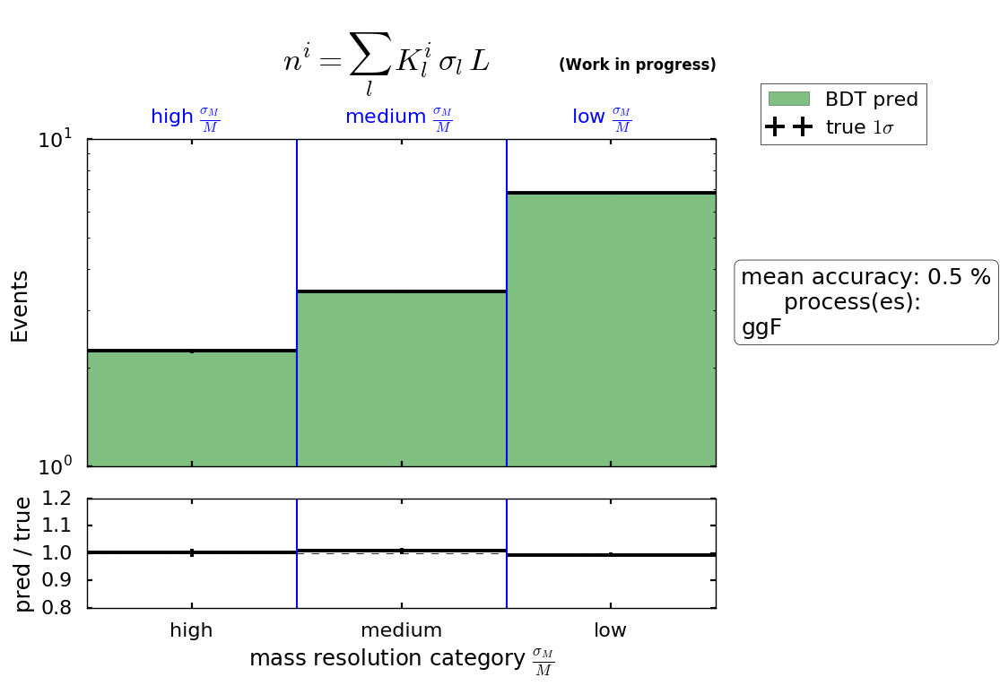

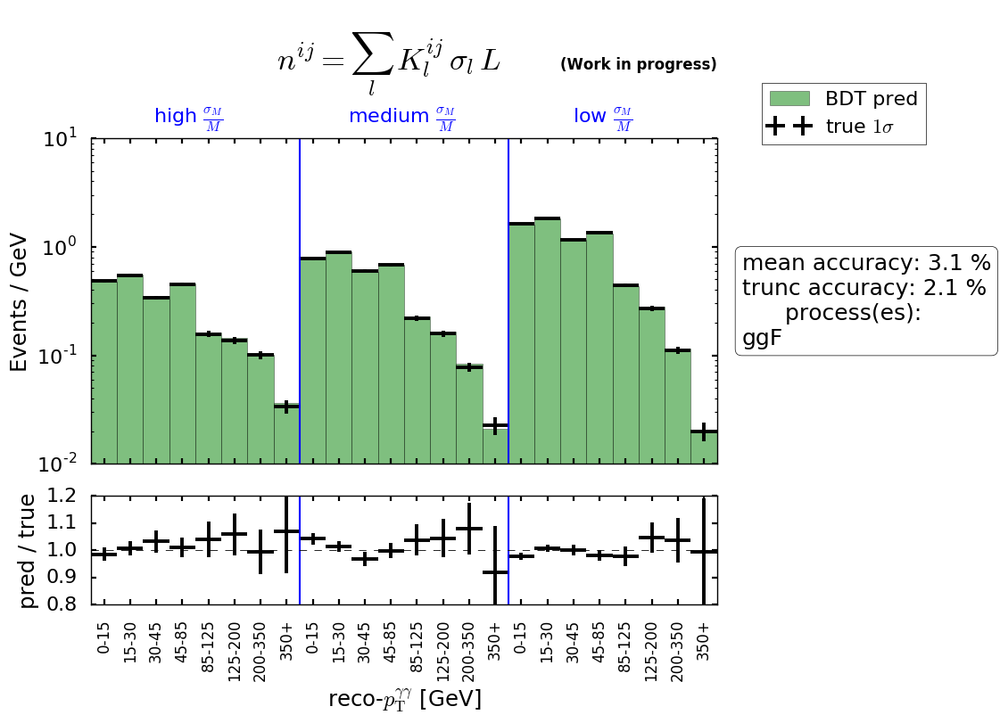

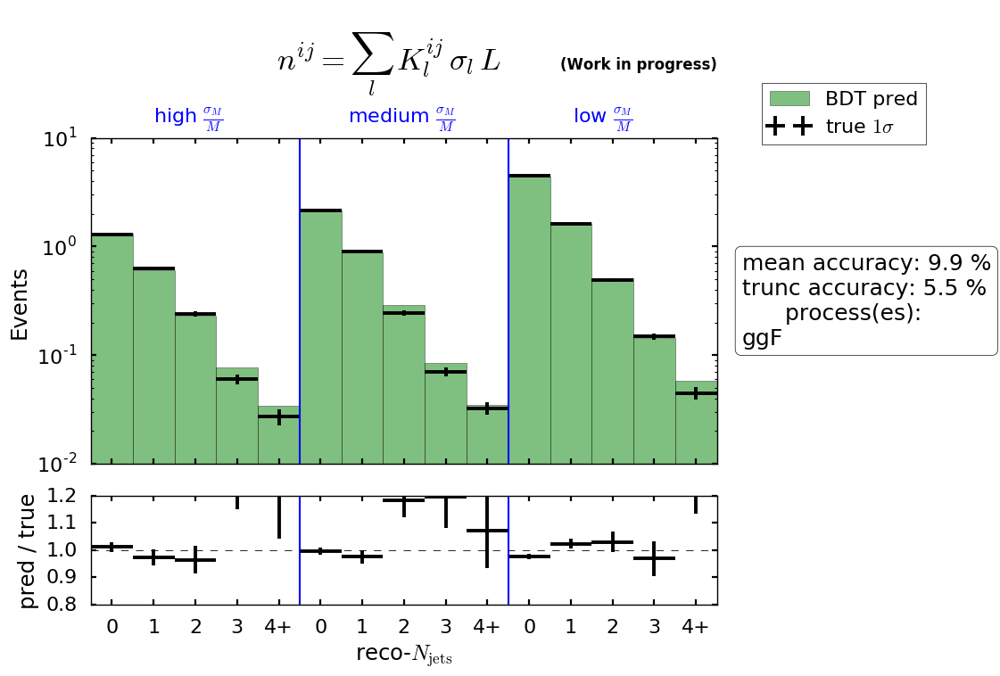

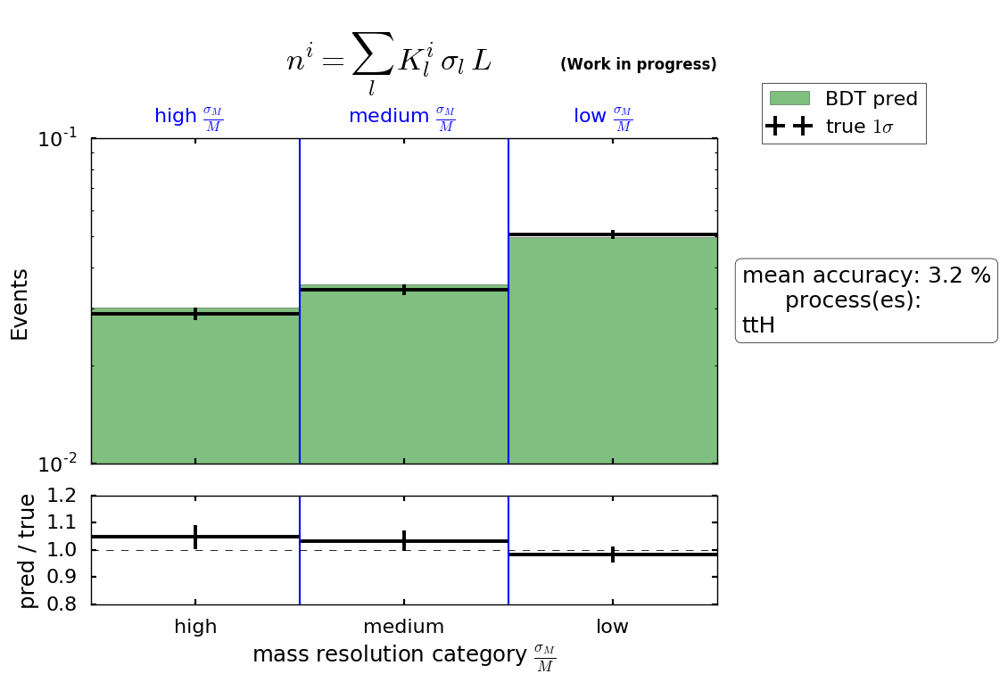

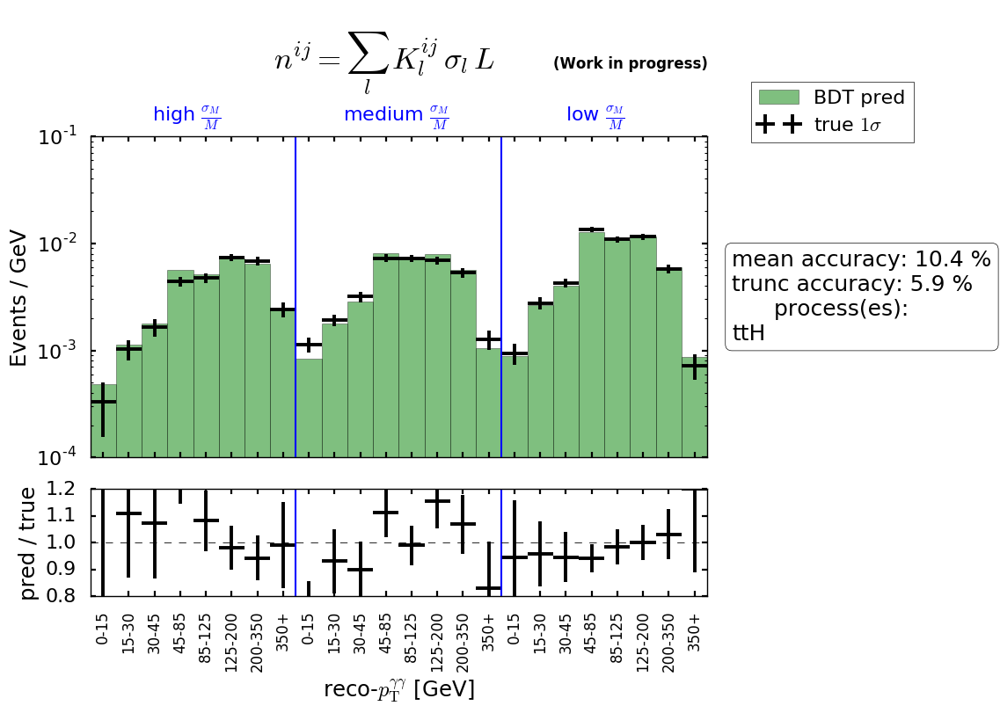

...

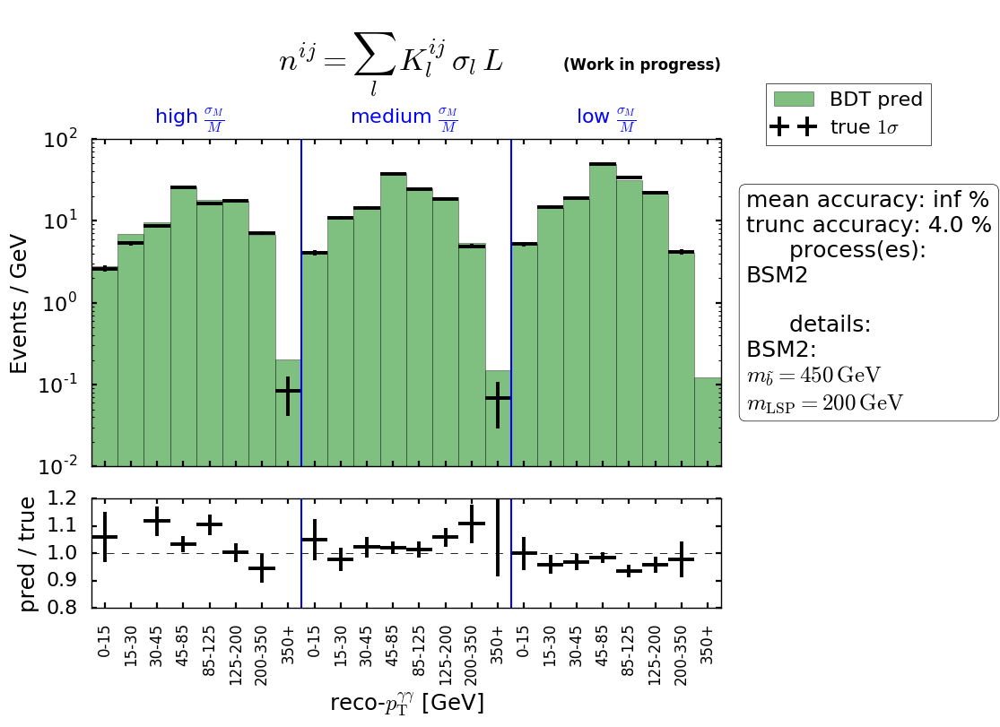

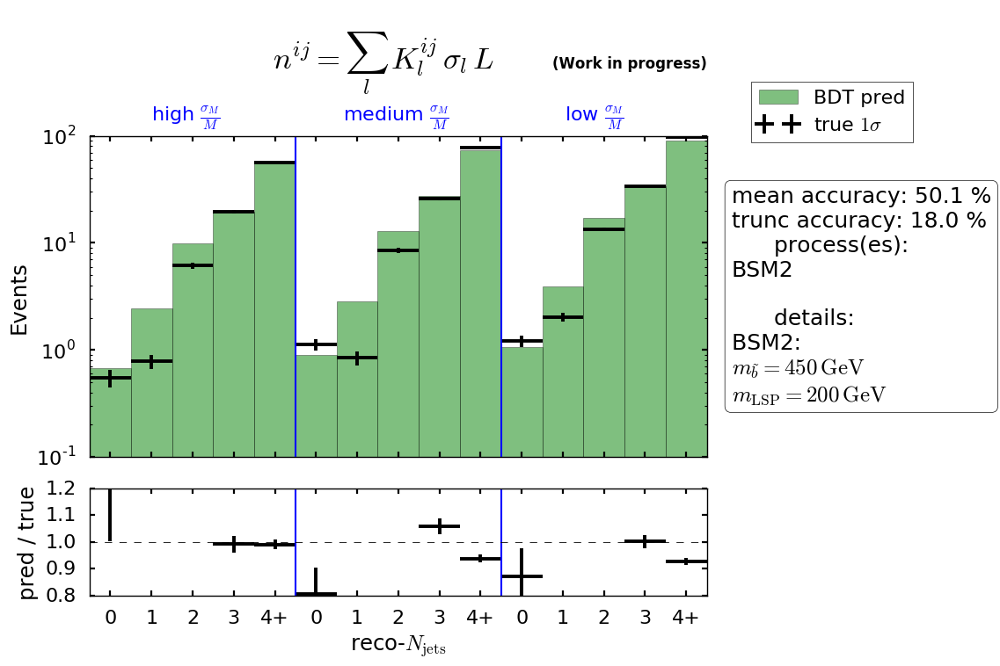

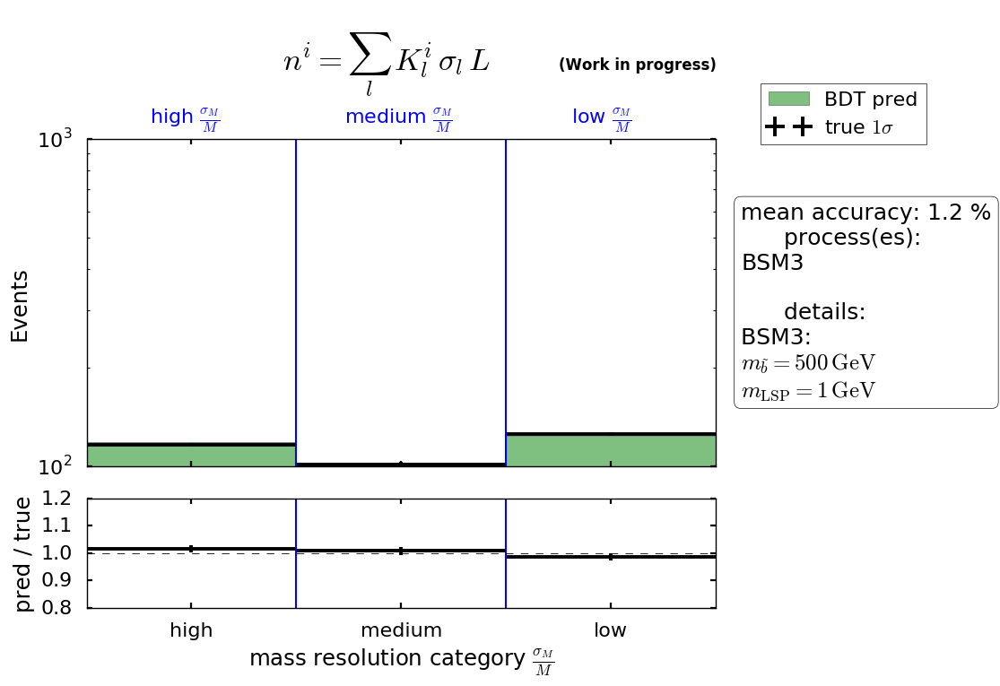

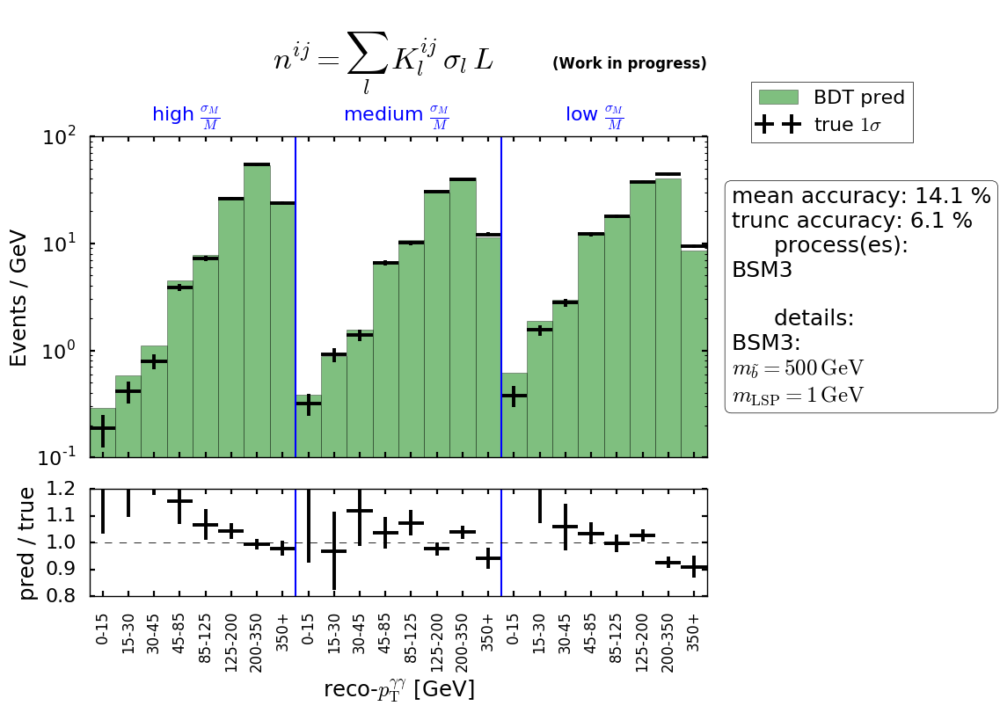

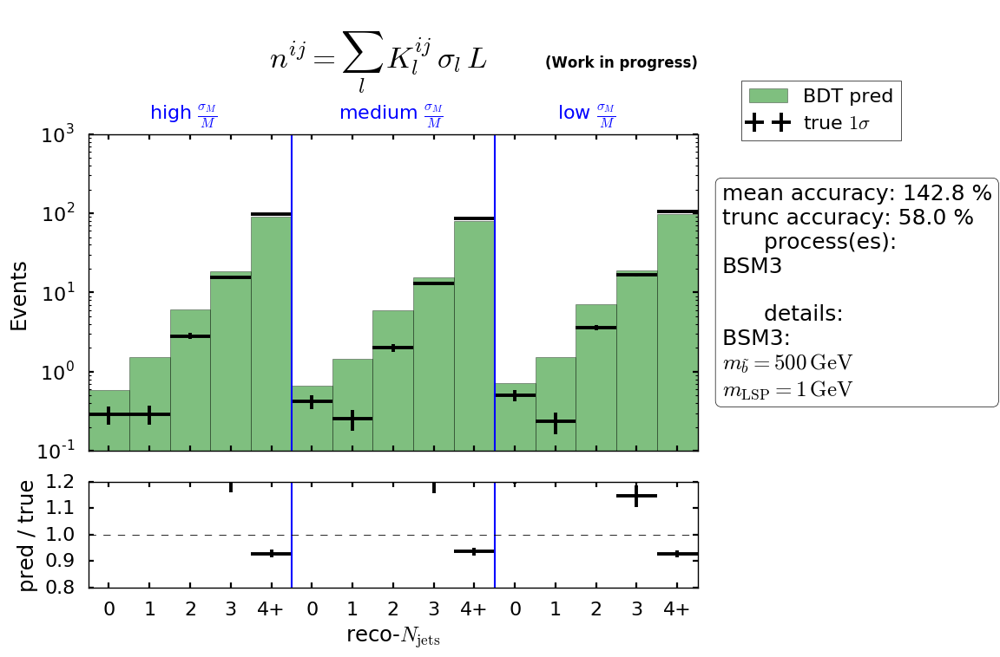

In [25]:
reload(plotting)
for process_OfInterest in [[0],[1],[2],[3],[0,1,2,3],[4],[5],[6]] :
#for process_OfInterest in [[0],[1],[2],[3]] :
    l = [GetProdProcName(n=s) for s in process_OfInterest]
    if (len(l) == 4) :
        l = ['SM']

    save_directory = './plots/N_reco/'+classifier_name+'/'+l[0]+'/'
    ensure_dir(file_path=save_directory)
    #save_directory =None
    print('save directory:',save_directory)


    proc_mask = df['proc'].isin(process_OfInterest)
    Pt_bin=0
    for cl in class_list :
        if ('class' in cl) :
            pl_title = r'$n^{i} = \sum_{l} \, K^{i}_l \, \sigma_l \, L$'
            xlabel = r'mass resolution category $\frac{\sigma_M}{M}$'
        else :
            pl_title = r'$n^{ij} = \sum_{l} \, K^{ij}_l \, \sigma_l \, L$'
            if('recoPt' in cl) :     
                xlabel = r'reco-$p_{\mathrm{T}}^{\gamma \gamma}$'
            if('recoNjets' in cl) :     
                xlabel = r'reco-$N_{\mathrm{jets}}$'
        plotting.draw_data_mc_2(
                    df=df[proc_mask],#&(df['absGenRapidityBin']==Rap_bin)],
                                   column = cl, 
                                  logy=True, 
                                  ratio=True,
                                  var=[xlabel,''],
                                  first=1,
                           savepath=save_directory,
                                  plot_title=pl_title,
                                  title=cl+'_'+GetProdProcName(process_OfInterest[0])+'PtBin'+str(Pt_bin),
                                  absolute=False,
                                model_processes = [GetProdProcName(n=s) for s in process_OfInterest],
                                re_weight=False
                                 )
   

('save directory:', './plots/N_reco/2clfs_flatAbsweight/ggF/')
There are 4 features of type class
class_ggFPtBin0
['ggF']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFPtBin0
sorted
1.00487004868
12
['ggF']
('save directory:', './plots/N_reco/2clfs_flatAbsweight/ttH/')
There are 4 features of type class
class_ttHPtBin0
['ttH']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHPtBin0
sorted
0.999794128556
12
['ttH']
('save directory:', './plots/N_reco/2clfs_flatAbsweight/VBF/')
There are 4 features of type class
class_VBFPtBin0
['VBF']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_VBFPtBin0
sorted
0.874978692927
12
['VBF']
('save directory:', './plots/N_reco/2clfs_flatAbsweight/VH/')
There are 4 features of type class
class_VHPtBin0
['VH']
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_VHPtBin0
sorted
0.658196686624
12
['VH']
('save directory:', './plots/N_reco/2clfs_flatAbsweight/SM/')
There are 4 features of type class
class_ggFPtBi

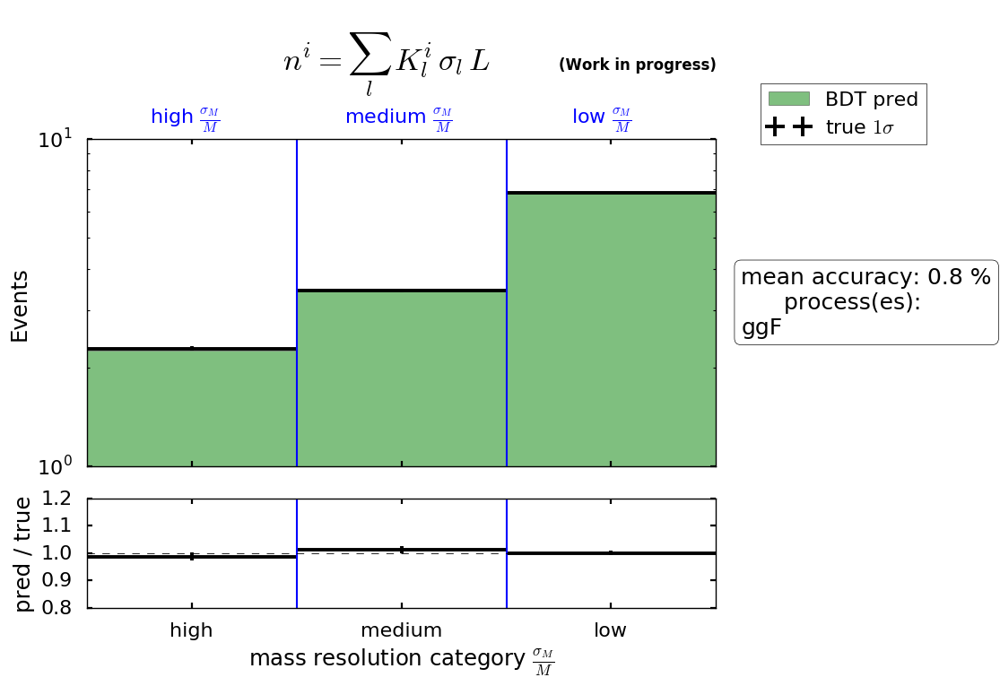

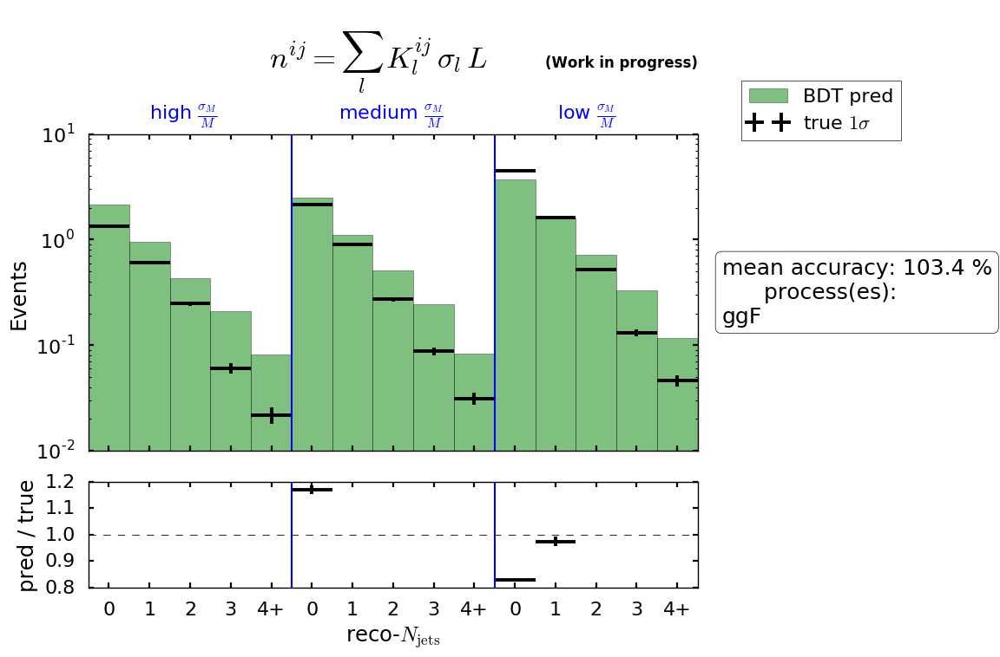

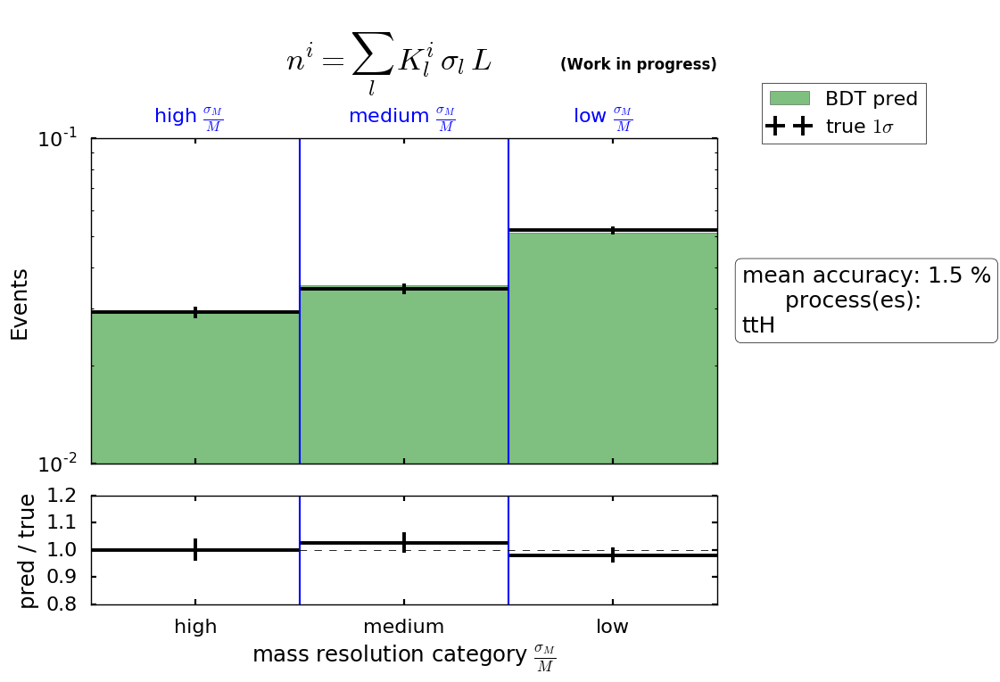

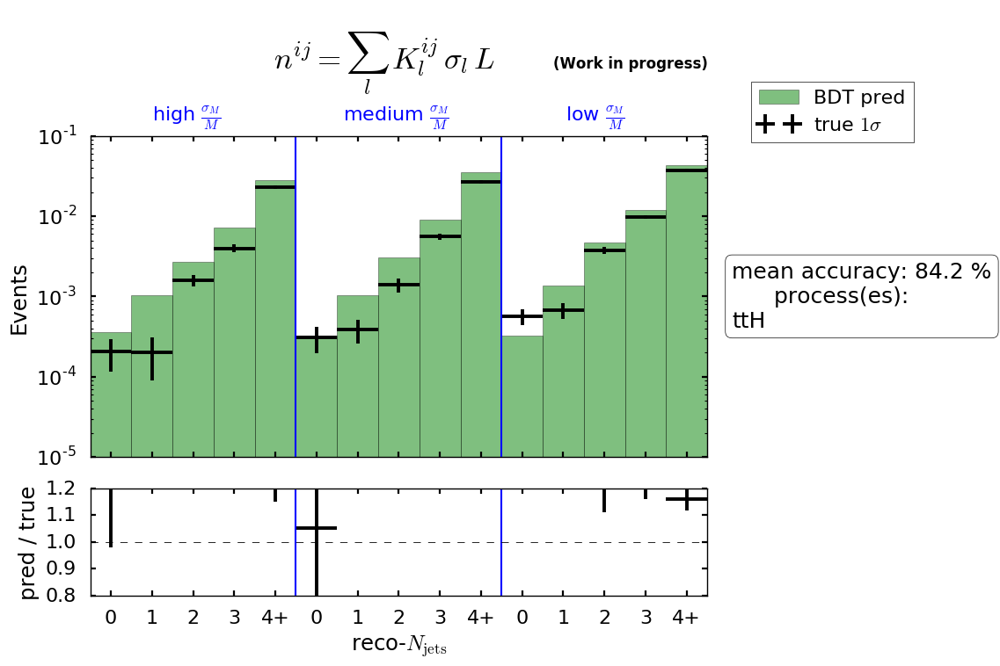

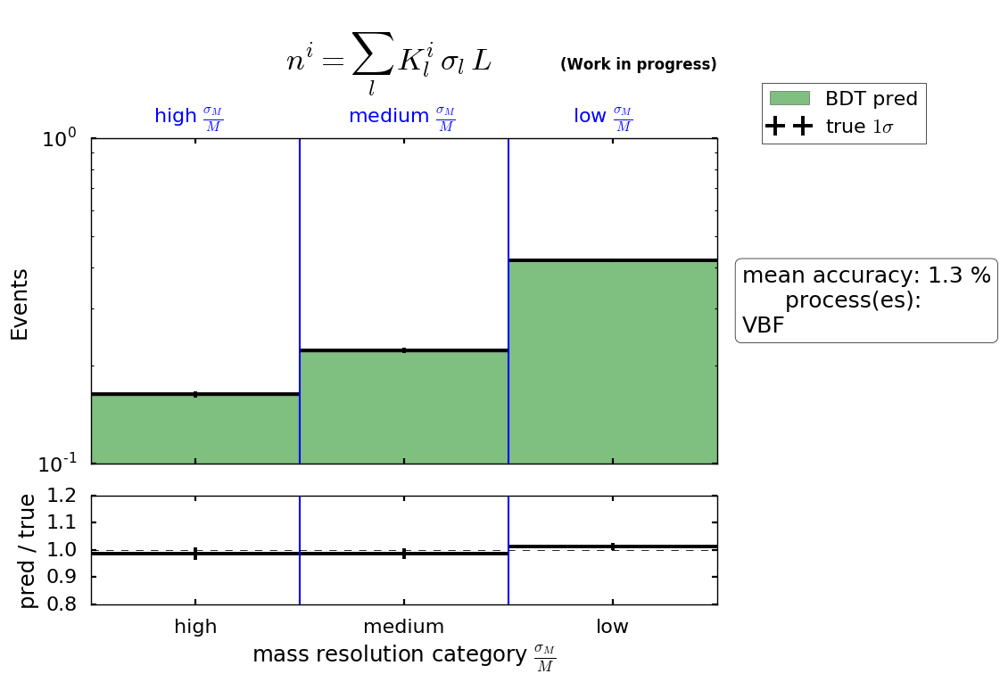

...

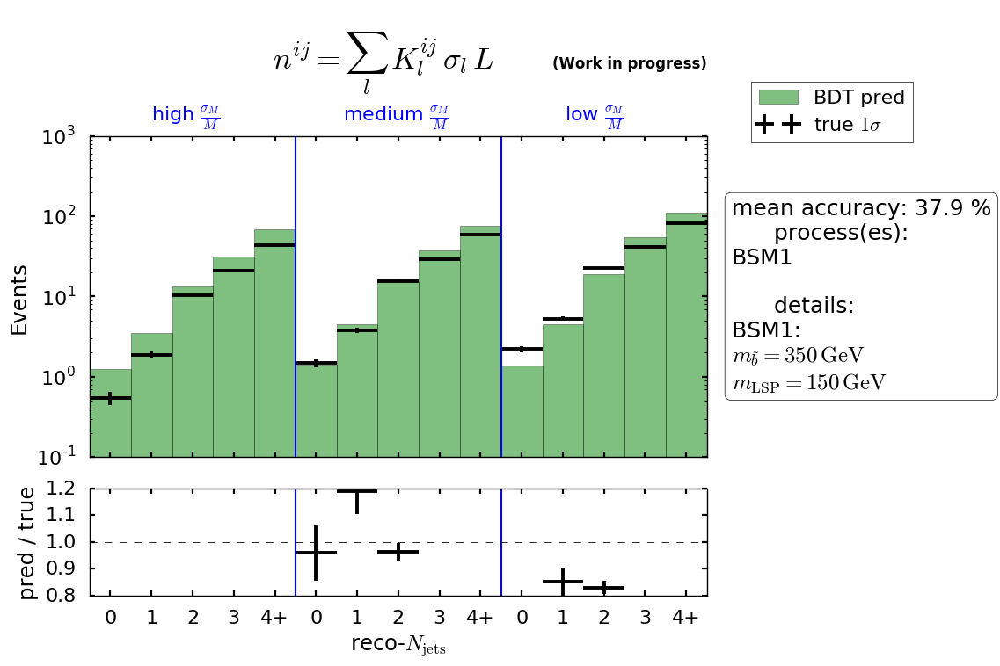

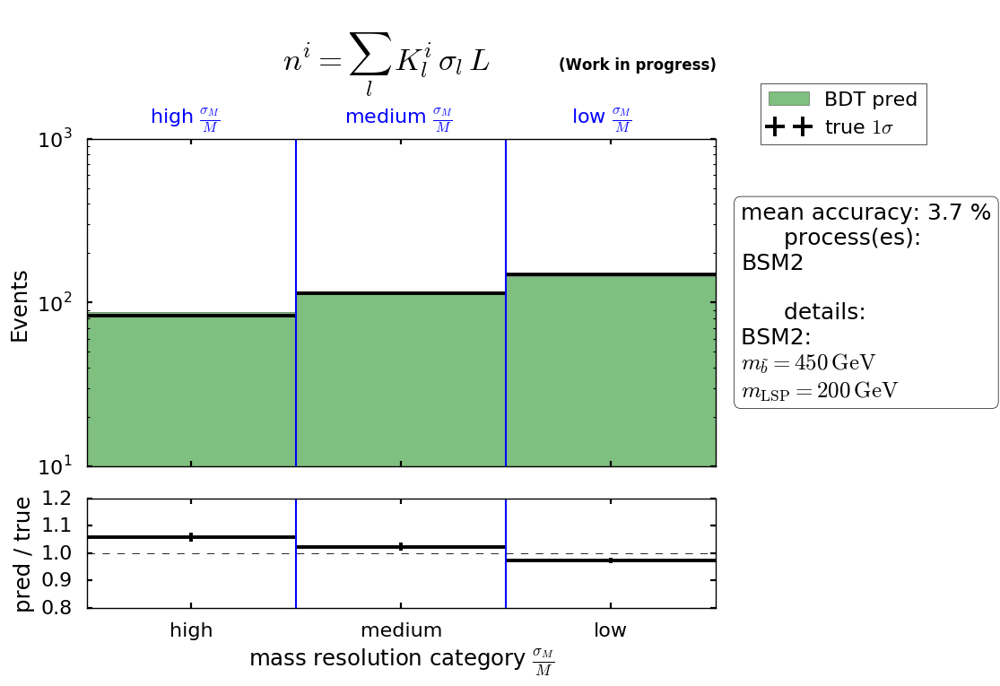

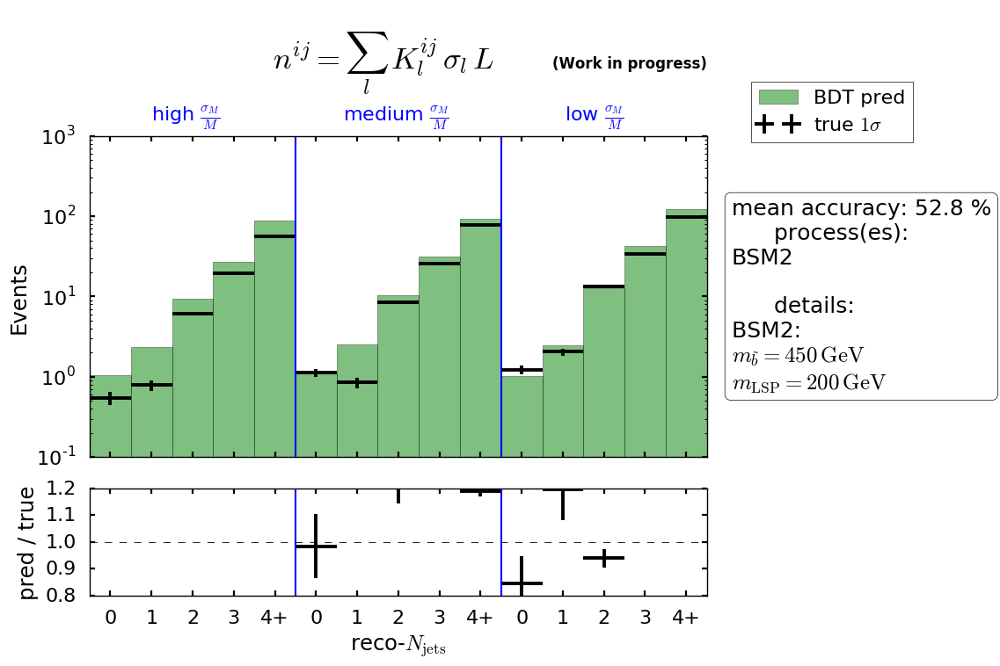

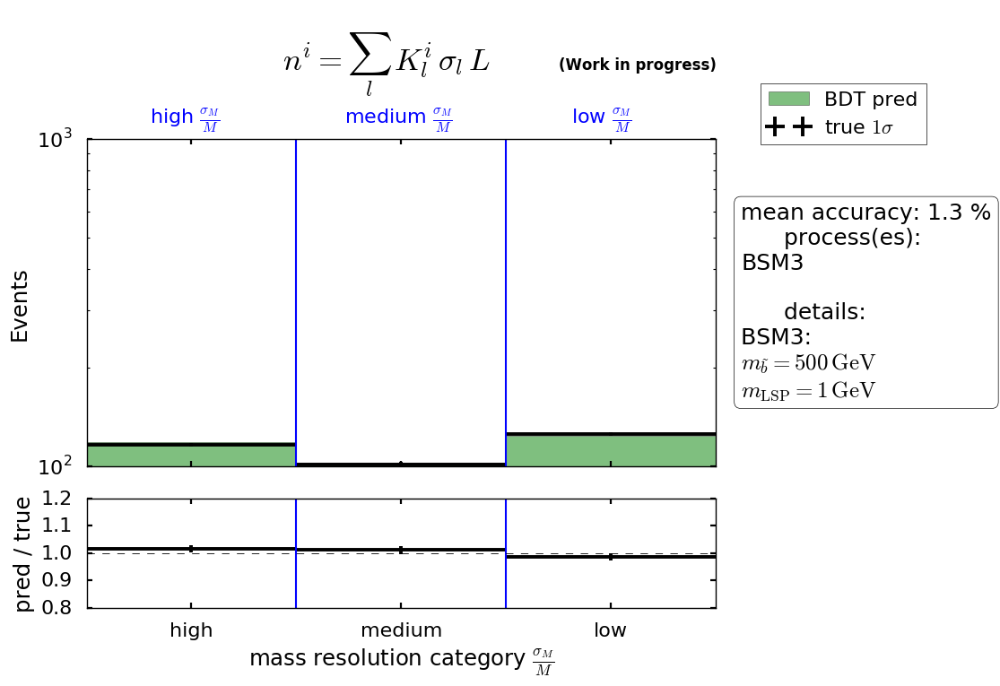

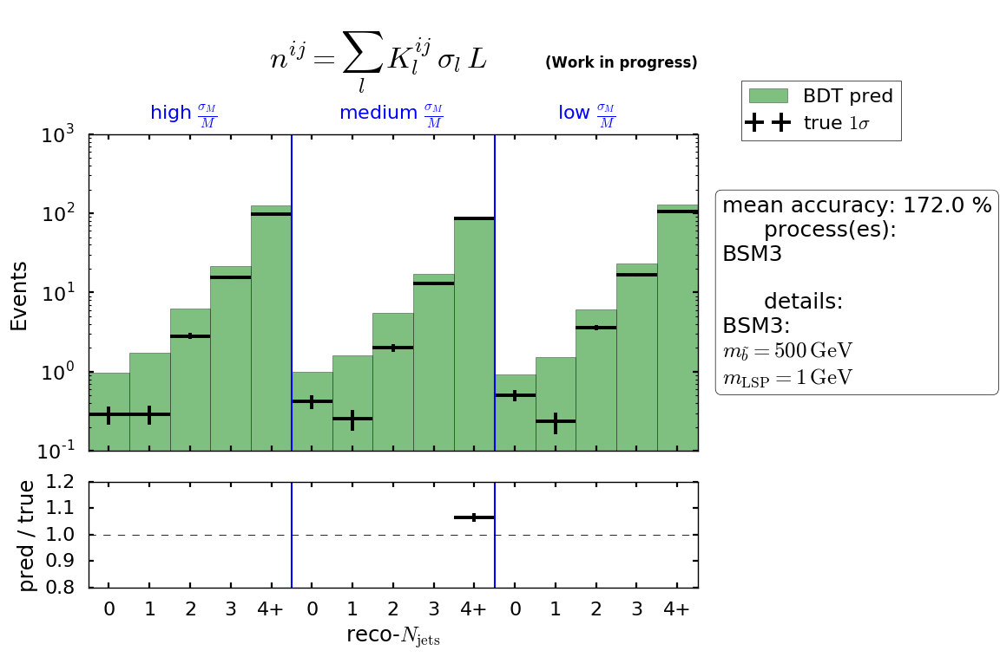

In [27]:
#class_list = ['class','recoPt','recoNjets2p5']
reload(plotting)
for process_OfInterest in [[0],[1],[2],[3],[0,1,2,3],[4],[5],[6]] :
#for process_OfInterest in [[0],[1],[2],[3]] :
    l = [GetProdProcName(n=s) for s in process_OfInterest]
    if (len(l) == 4) :
        l = ['SM']

    save_directory = './plots/N_reco/'+classifier_name+'/'+l[0]+'/'
    ensure_dir(file_path=save_directory)
    #save_directory =None
    print('save directory:',save_directory)


    proc_mask = df['proc'].isin(process_OfInterest)
    Pt_bin=0
    for cl in class_list :
        if ('class' in cl) :
            pl_title = r'$n^{i} = \sum_{l} \, K^{i}_l \, \sigma_l \, L$'
            xlabel = r'mass resolution category $\frac{\sigma_M}{M}$'
        else :
            pl_title = r'$n^{ij} = \sum_{l} \, K^{ij}_l \, \sigma_l \, L$'
            if('recoPt' in cl) :     
                xlabel = r'reco-$p_{\mathrm{T}}^{\gamma \gamma}$'
            if('recoNjets' in cl) :     
                xlabel = r'reco-$N_{\mathrm{jets}}$'
        plotting.draw_data_mc_2(
                    df=df[proc_mask],#&(df['absGenRapidityBin']==Rap_bin)],
                                   column = cl, 
                                  logy=True, 
                                  ratio=True,
                                  var=[xlabel,''],
                                  first=1,
                           savepath=save_directory,
                                  plot_title=pl_title,
                                  title=cl+'_'+GetProdProcName(process_OfInterest[0])+'PtBin'+str(Pt_bin),
                                  absolute=False,
                                model_processes = [GetProdProcName(n=s) for s in process_OfInterest]
                                 )
   

# Differential in gen-level bins of recoNjets2p5

('save directory:', './plots/N_reco_differential_recoNjets/pt20GeVcut/ggF/')
('Njets_bin ', 0)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin0


plotting.py:709: FutureWarning: comparison to `None` will result in an elementwise object comparison in the future.
  if axes == None: axes = fig.axes


('Njets_bin ', 1)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin1
('Njets_bin ', 2)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin2
('Njets_bin ', 3)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin3
('Njets_bin ', 4)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin4
('save directory:', './plots/N_reco_differential_recoNjets/pt20GeVcut/ttH/')
('Njets_bin ', 0)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHNjetsBin0
('Njets_bin ', 1)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHNjetsBin1
('Njets_bin ', 2)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHNjetsBin2
('Njets_bin ', 3)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHNjetsBin3
('Njets_bin ', 4)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ttHNjetsBin4
('save directory:', './plots/N_reco_differential_recoNjets/pt20GeVcut/VBF/')
('Njets_bin ', 0)
There are 16 featu

/swshare/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


recoNjets2p5_ggFNjetsBin0
('Njets_bin ', 1)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin1
('Njets_bin ', 2)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin2
('Njets_bin ', 3)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin3
('Njets_bin ', 4)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_ggFNjetsBin4
('save directory:', './plots/N_reco_differential_recoNjets/pt20GeVcut/BSM1/')
('Njets_bin ', 0)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM1NjetsBin0
('Njets_bin ', 1)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM1NjetsBin1
('Njets_bin ', 2)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM1NjetsBin2
('Njets_bin ', 3)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM1NjetsBin3
('Njets_bin ', 4)
There are 16 features of type recoNjets2p5Cat
recoNjets2p5_BSM1NjetsBin4
('save directory:', './plots/N_reco_differential_recoNjets/pt20GeVcut/BSM2/')
('N

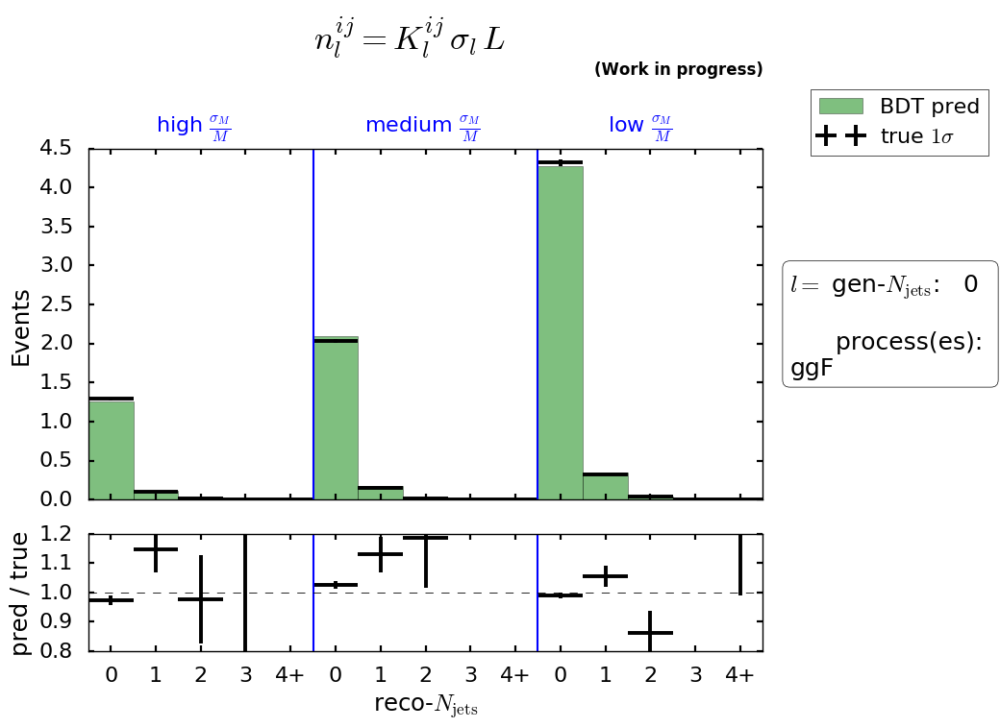

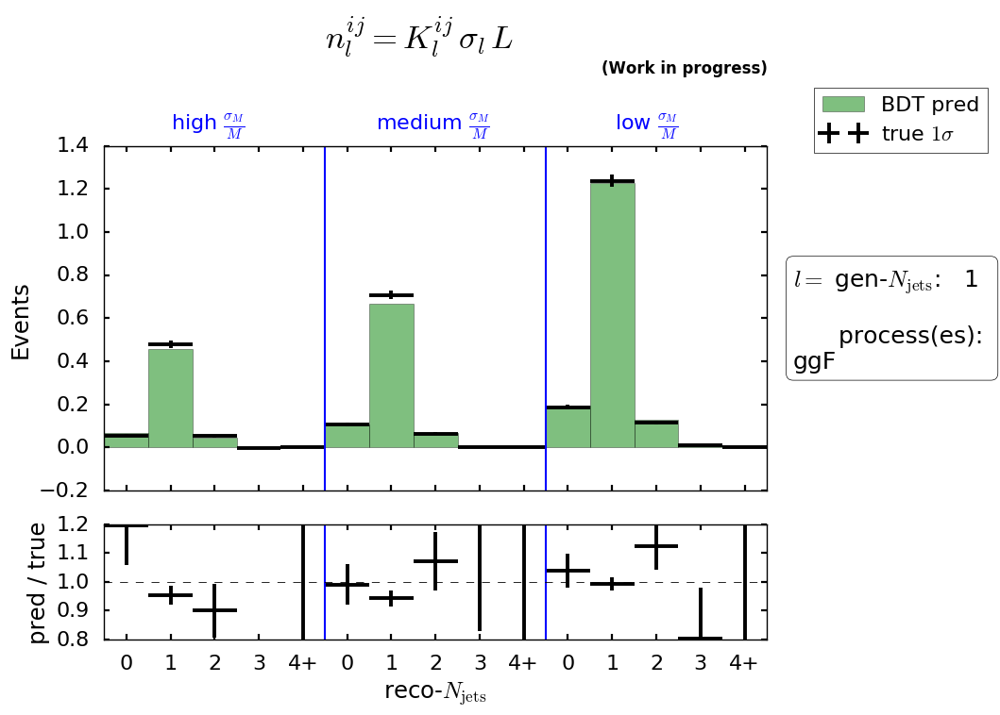

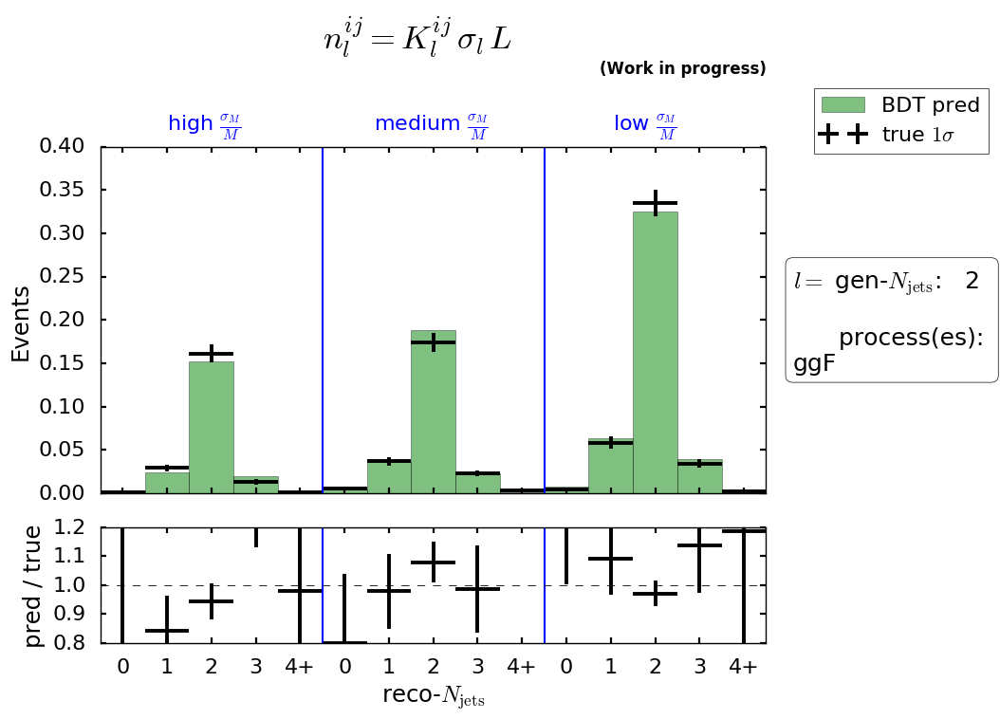

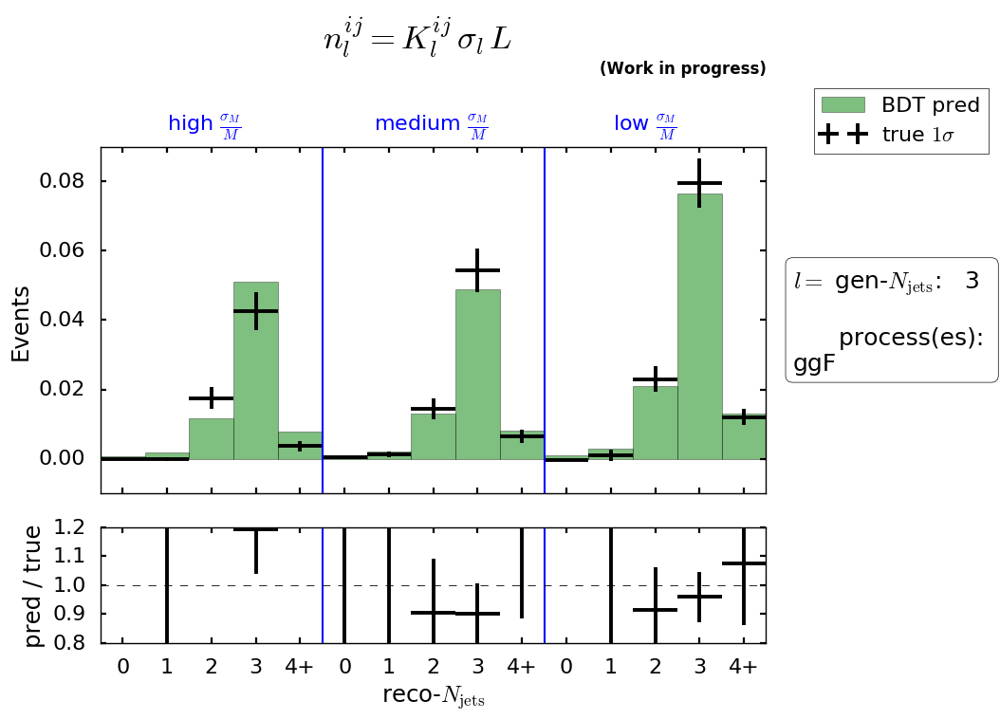

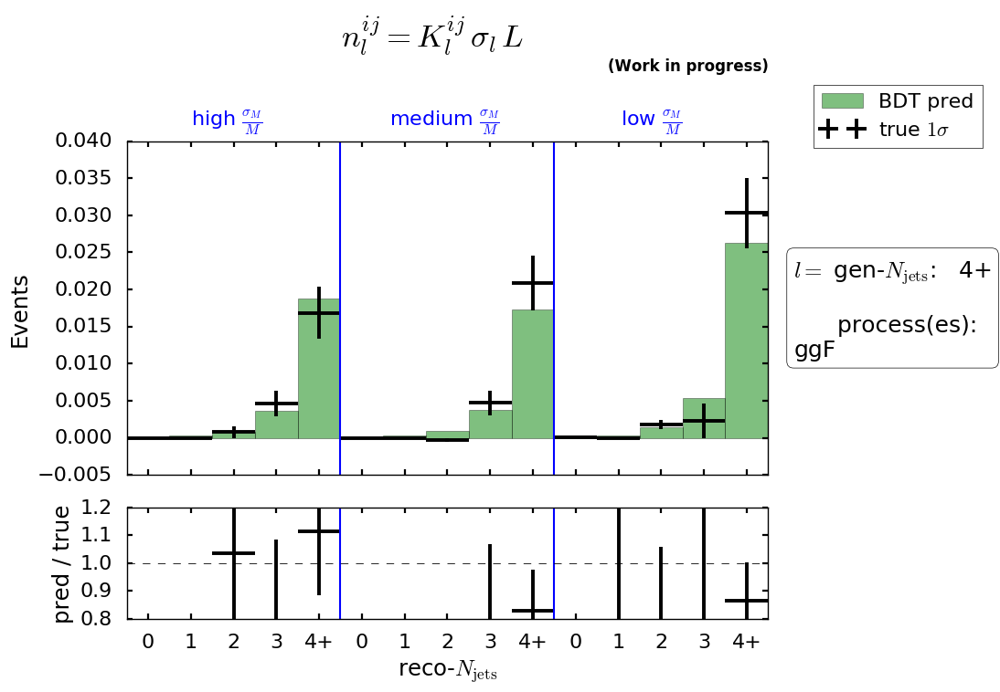

...

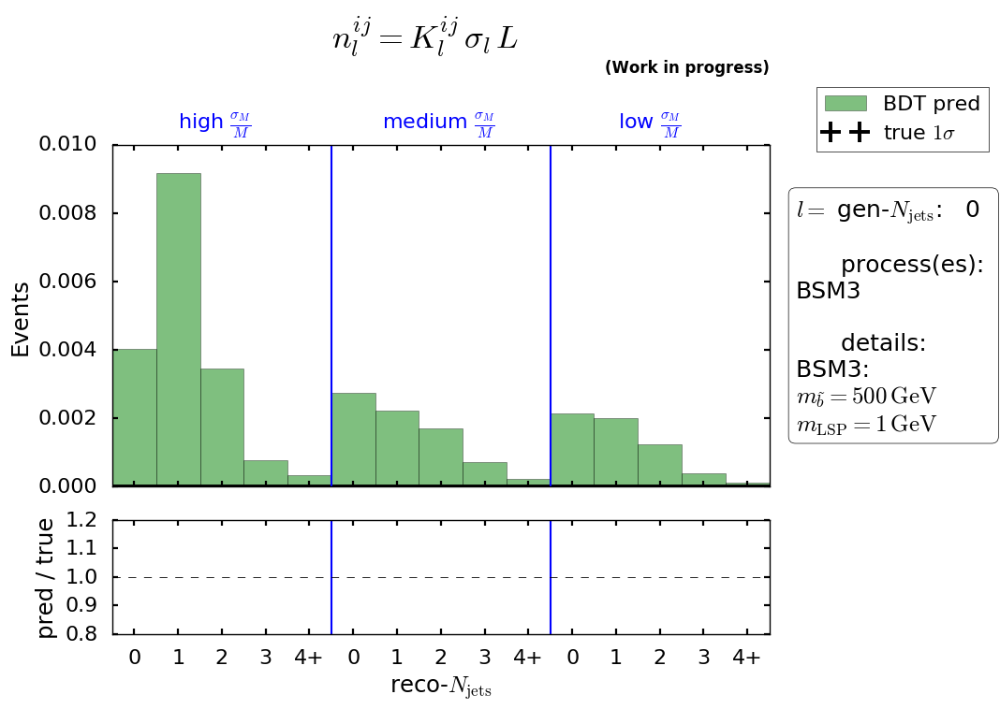

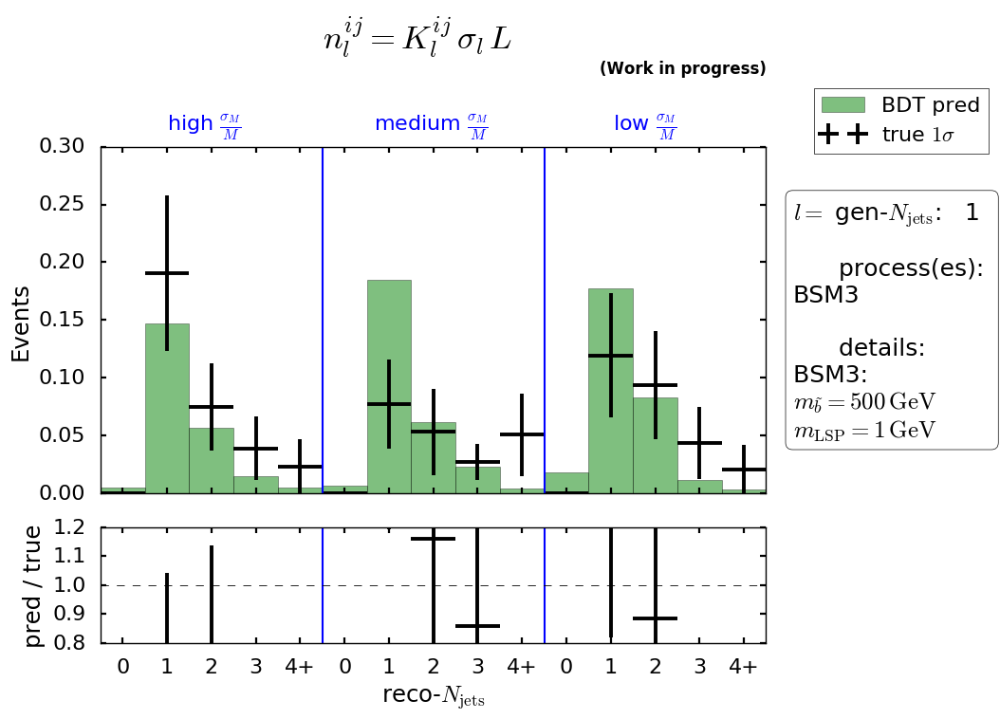

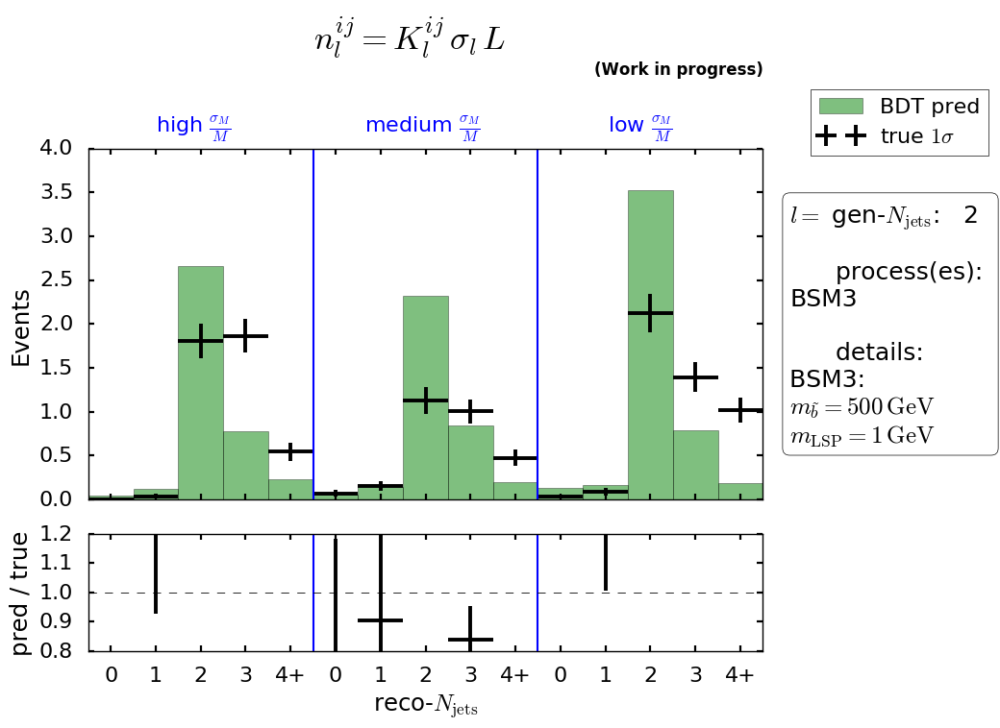

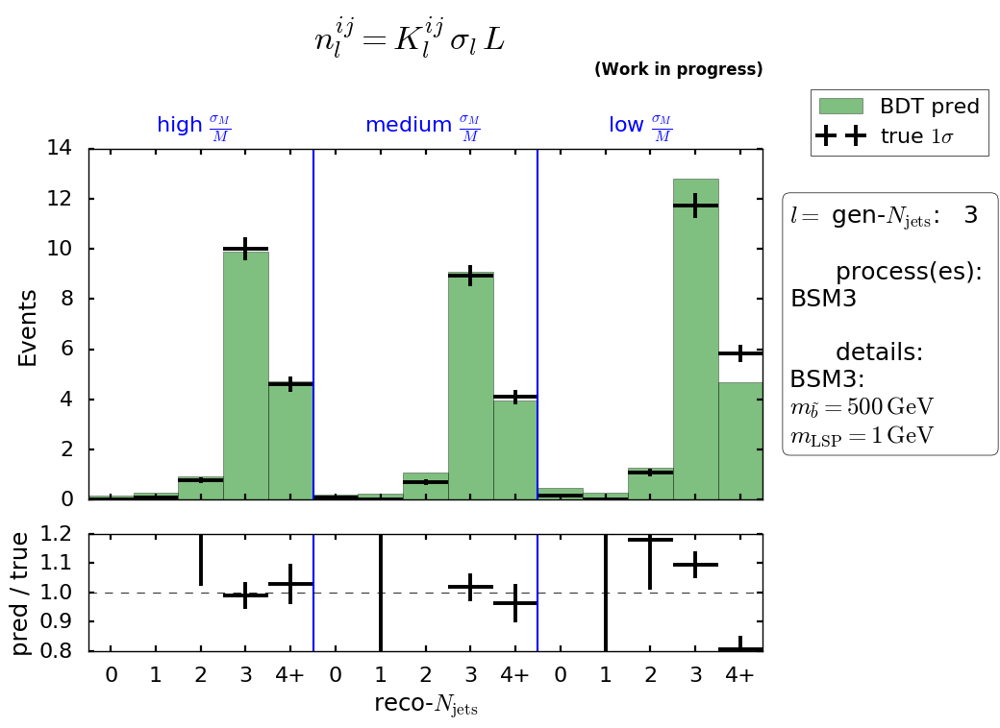

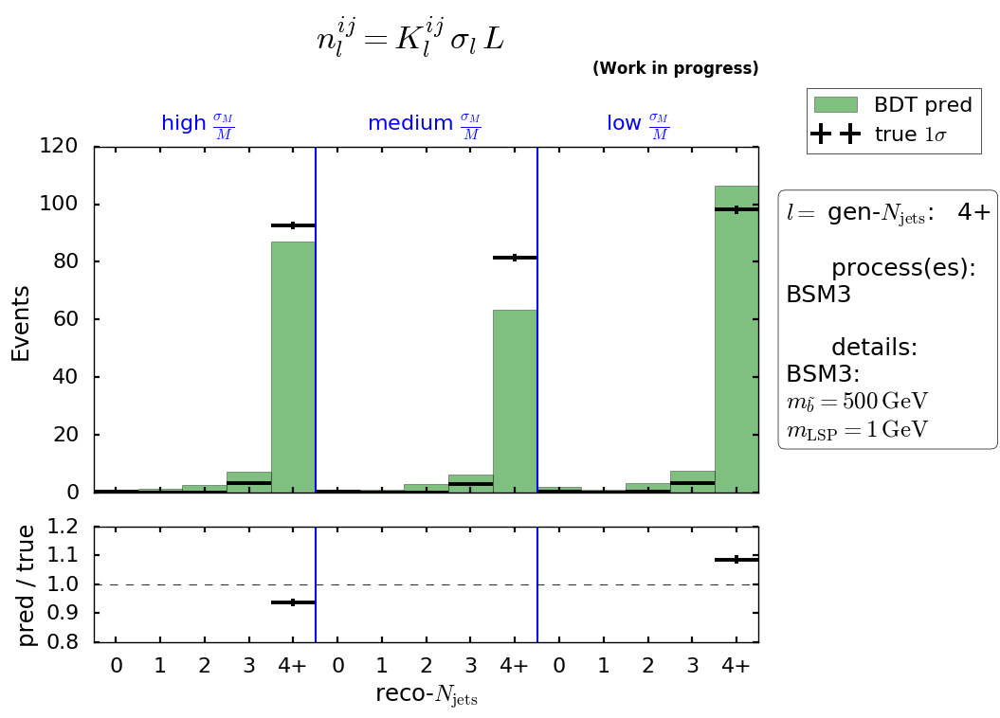

In [25]:
reload(plotting)
for process_OfInterest in [[0],[1],[2],[3],[0,1,2,3],[4],[5],[6]] :
    l = [GetProdProcName(n=s) for s in process_OfInterest]
    if (len(l) == 4) :
        l = ['SM']

    save_directory = './plots/N_reco_differential_recoNjets/'+classifier_name+'/'+l[0]+'/'
    ensure_dir(file_path=save_directory)
    #save_directory =None
    print('save directory:',save_directory)


    proc_mask = df['proc'].isin(process_OfInterest)
    N_reco_pred_matrix=[]
    N_reco_true_matrix=[]
    N_err_reco_true_matrix=[]

    cl = 'recoNjets2p5'
    xlabel = r'reco-$N_{\mathrm{jets}}$'
    for Njets_bin in xrange(df['genNjets2p5Bin'].min(),df['genNjets2p5Bin'].max()+1,1) :
        print ('Njets_bin ',Njets_bin)
        Njets_mask = df['genNjets2p5Bin']==Njets_bin
        pl_title = r'$n^{ij}_{l} = K^{ij}_l \, \sigma_l \, L$'

        N_ij_l_pred,N_ij_l_true, N_ij_l_true_err = plotting.draw_data_mc(
                df=df[proc_mask&Njets_mask],#&(df['absGenRapidityBin']==Rap_bin)],
                               column = cl, 
                              logy=False, 
                              ratio=True,
                              var=[xlabel,''],
                              first=1,
                       savepath=save_directory,
                              plot_title=pl_title,
                              title=cl+'_'+GetProdProcName(process_OfInterest[0])+'NjetsBin'+str(Njets_bin),
                              absolute=False,
                            model_processes = [GetProdProcName(n=s) for s in process_OfInterest],
                        DiffGenVariable=True
                             )
        N_reco_pred_matrix.append(N_ij_l_pred)
        N_reco_true_matrix.append(N_ij_l_true)
        N_err_reco_true_matrix.append(N_ij_l_true_err)
    #change list to 2D array and transpose to have the right 
    #dimensions (3J+1,L)
    N_reco_pred_matrix = np.array(N_reco_pred_matrix).T
    N_reco_true_matrix = np.array(N_reco_true_matrix).T
    N_err_reco_true_matrix = np.array(N_err_reco_true_matrix).T  
        



    path = '/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/differential_recoMatrices/'+classifier_name+'/recoNjets/'      
    name = l[0]
    ensure_dir(file_path=path+name)

    np.save(path+'N_reco_pred_'+name,N_reco_pred_matrix)
    np.save(path+'N_reco_true_'+name,N_reco_true_matrix)
    np.save(path+'N_err_reco_true_'+name,N_err_reco_true_matrix)


## repeat for differential genPt

('save directory:', './plots/N_reco_differential_recoPt/3clfs_std/SM/')
('Pt bin ', 0)
There are 25 features of type recoPtCat
recoPt_ggFPtBin0
('Pt bin ', 1)
There are 25 features of type recoPtCat
recoPt_ggFPtBin1
('Pt bin ', 2)
There are 25 features of type recoPtCat
recoPt_ggFPtBin2
('Pt bin ', 3)
There are 25 features of type recoPtCat
recoPt_ggFPtBin3
('Pt bin ', 4)
There are 25 features of type recoPtCat
recoPt_ggFPtBin4
('Pt bin ', 5)
There are 25 features of type recoPtCat
recoPt_ggFPtBin5
('Pt bin ', 6)
There are 25 features of type recoPtCat
recoPt_ggFPtBin6
('Pt bin ', 7)
There are 25 features of type recoPtCat
recoPt_ggFPtBin7
('save directory:', './plots/N_reco_differential_recoPt/3clfs_std/ggF/')
('Pt bin ', 0)
There are 25 features of type recoPtCat
recoPt_ggFPtBin0
('Pt bin ', 1)
There are 25 features of type recoPtCat
recoPt_ggFPtBin1
('Pt bin ', 2)
There are 25 features of type recoPtCat
recoPt_ggFPtBin2
('Pt bin ', 3)
There are 25 features of type recoPtCat
recoPt_g

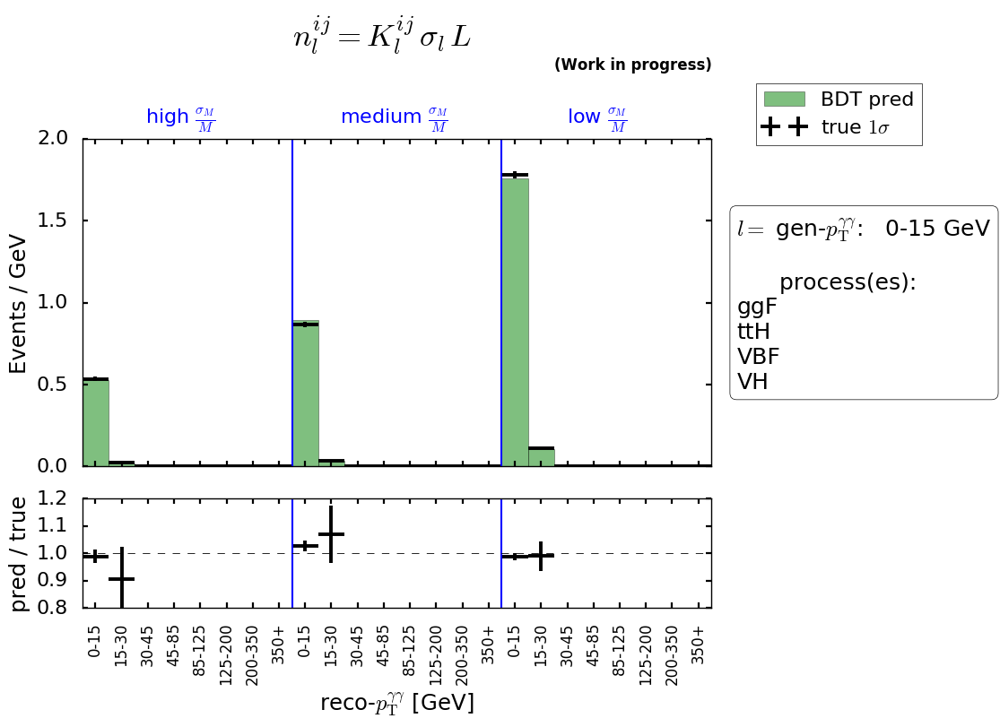

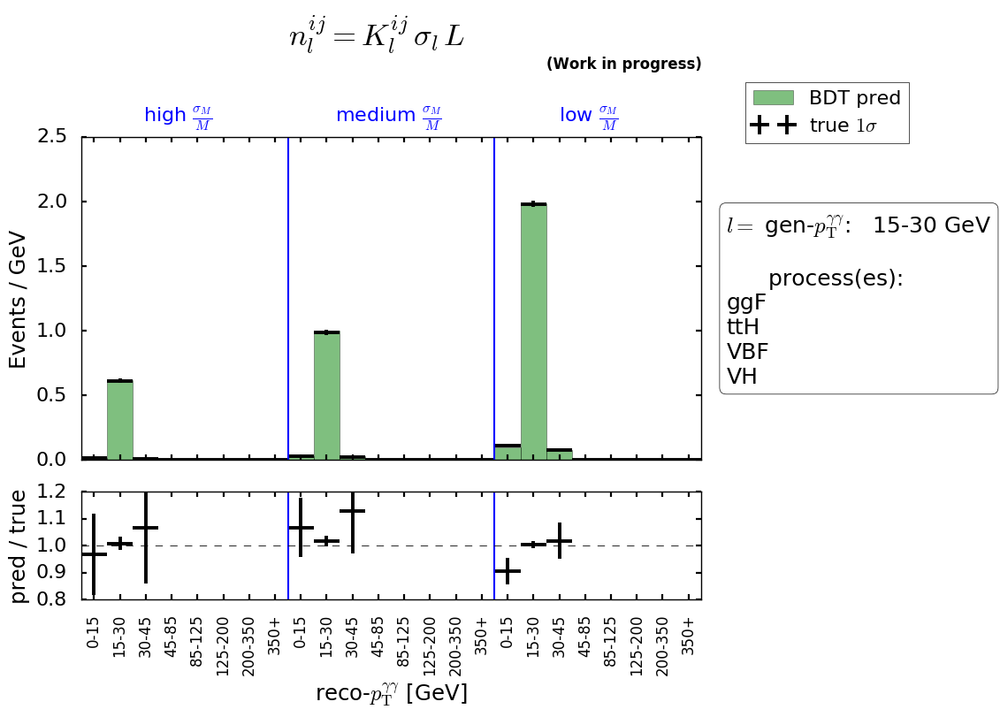

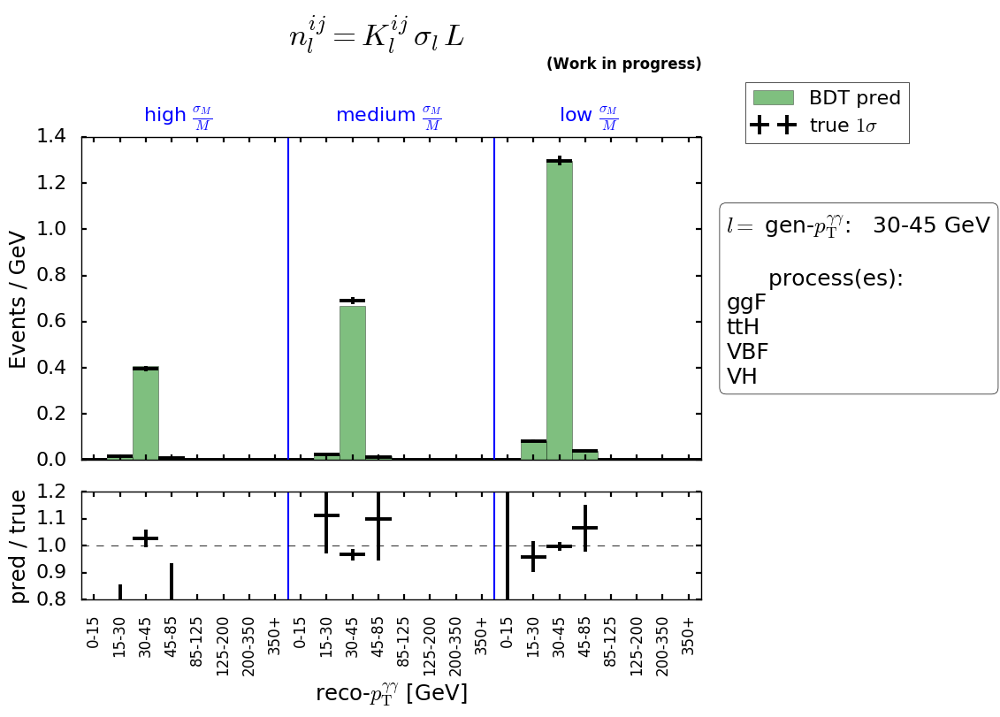

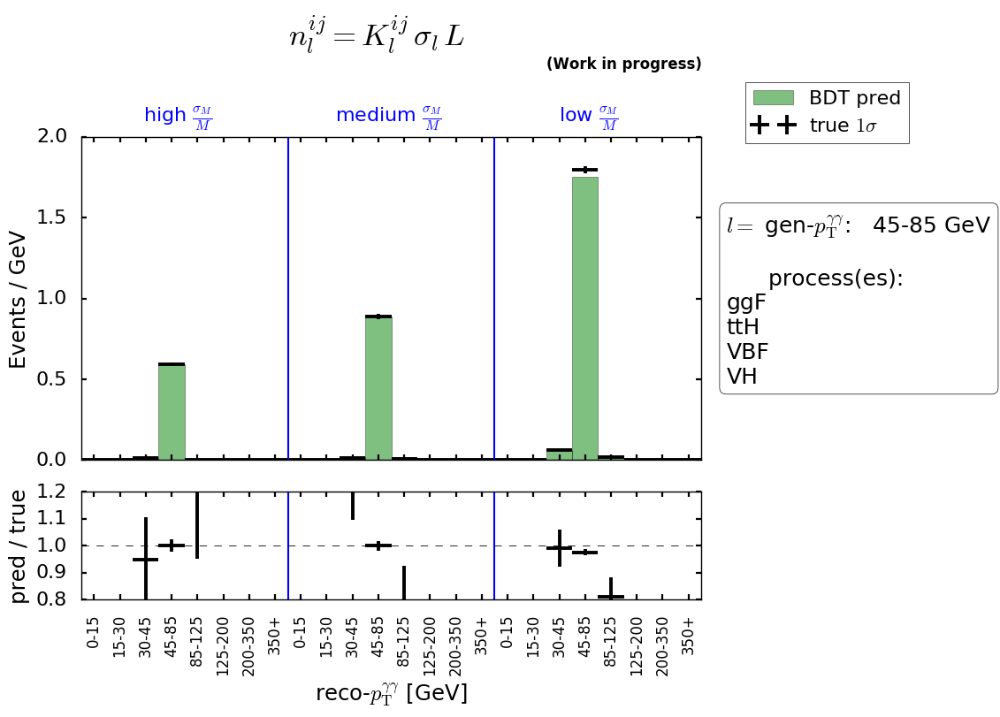

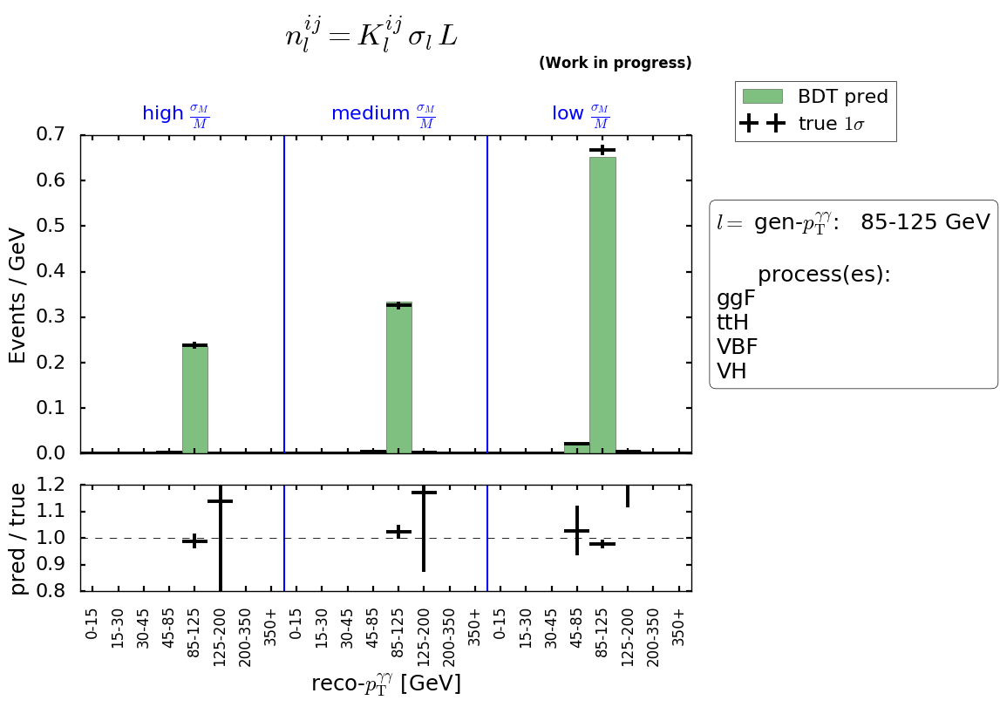

...

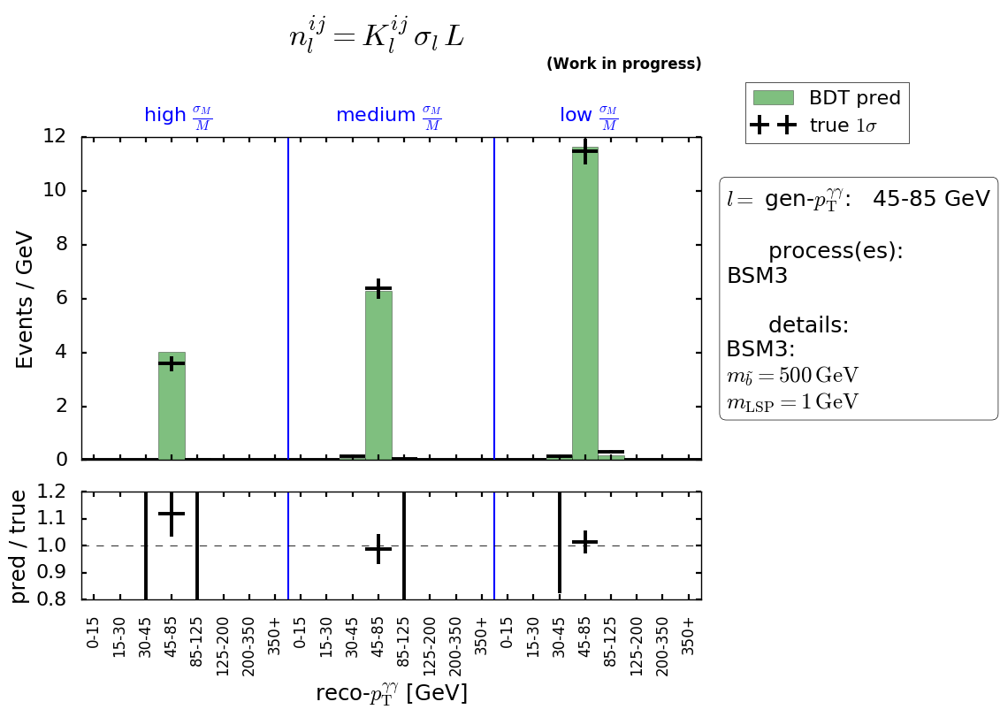

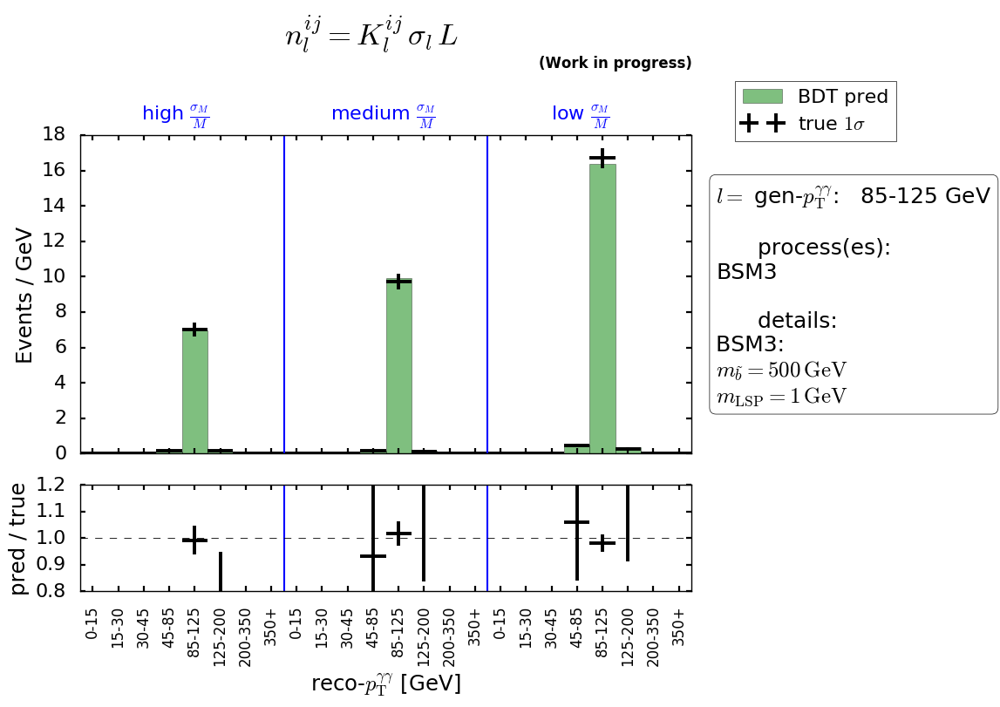

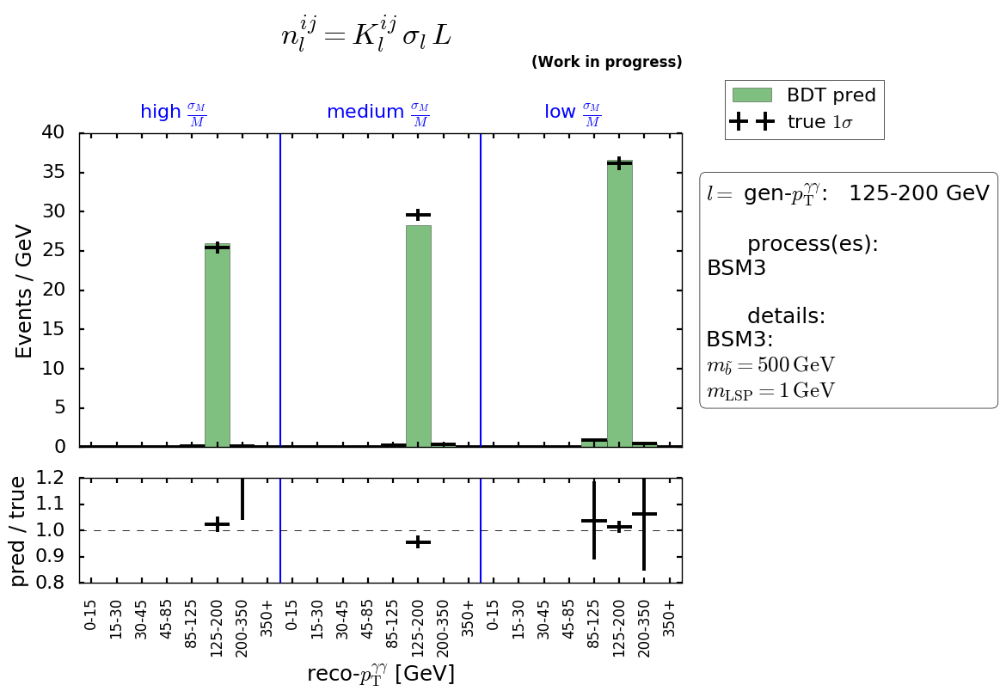

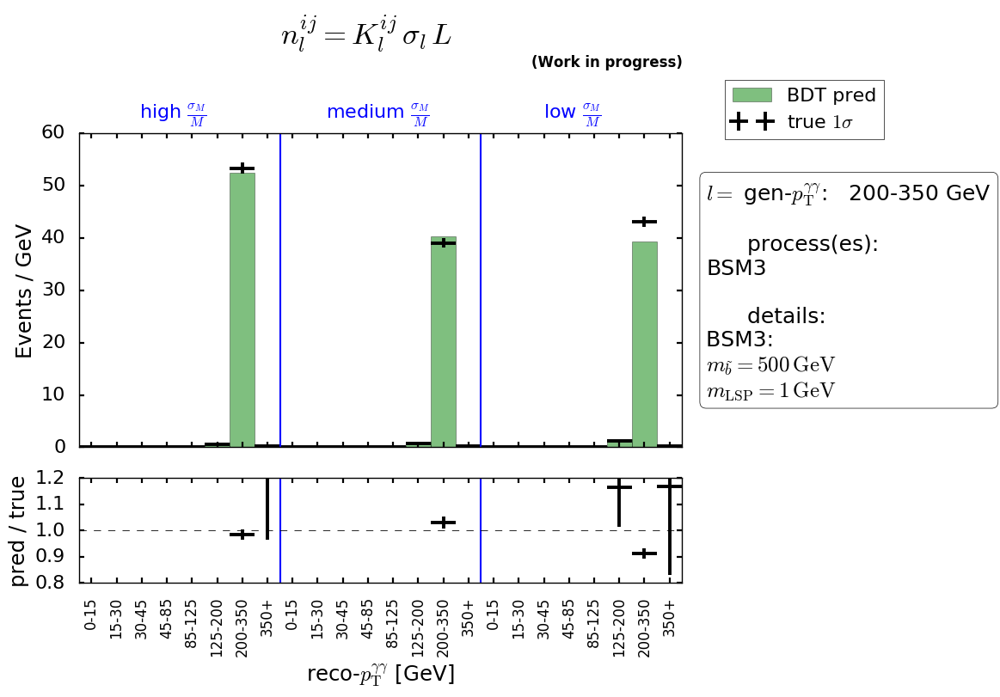

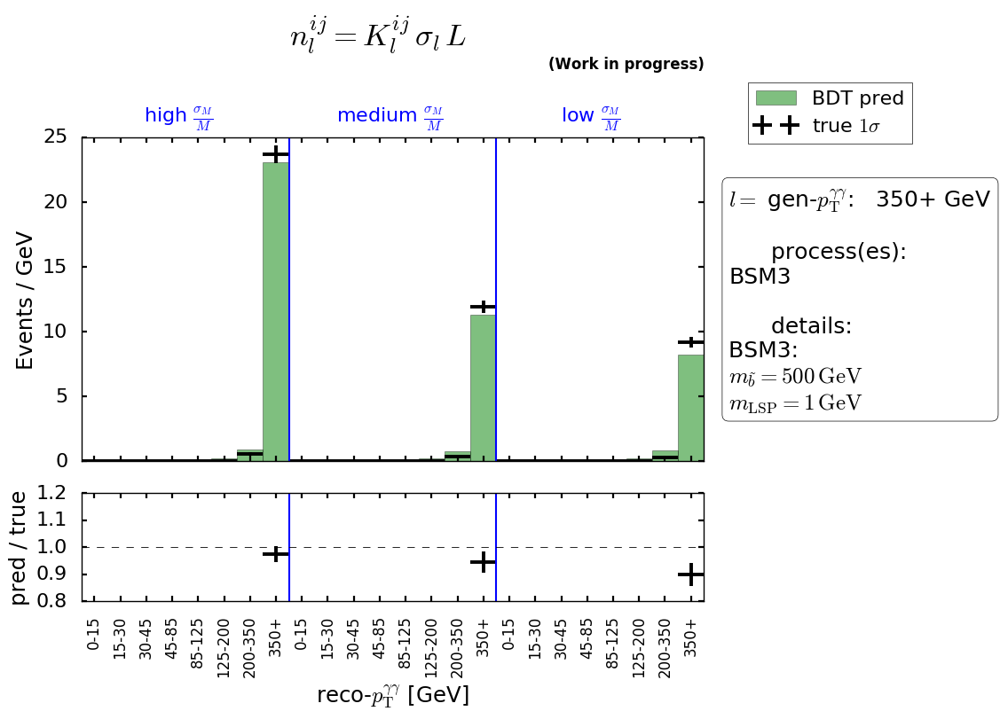

In [32]:
reload(plotting)
for process_OfInterest in [[0,1,2,3],[0],[1],[2],[3],[4],[5],[6]] :
    l = [GetProdProcName(n=s) for s in process_OfInterest]
    if (len(l) == 4) :
        l = ['SM']

    save_directory = './plots/N_reco_differential_recoPt/'+classifier_name+'/'+l[0]+'/'
    ensure_dir(file_path=save_directory)
    #save_directory =None
    print('save directory:',save_directory)


    proc_mask = df['proc'].isin(process_OfInterest)
    N_reco_pred_matrix=[]
    N_reco_true_matrix=[]
    N_err_reco_true_matrix=[]

    cl = 'recoPt'
    xlabel = r'reco-$p_{\mathrm{T}}^{\gamma \gamma}$'

    for Pt_bin in xrange(df['genPtBin'].min(),df['genPtBin'].max()+1,1) :
        print ('Pt bin ',Pt_bin)
        Pt_mask = df['genPtBin']==Pt_bin
        pl_title = r'$n^{ij}_{l} = K^{ij}_l \, \sigma_l \, L$'

        N_ij_l_pred,N_ij_l_true, N_ij_l_true_err = plotting.draw_data_mc(
                            df=df[proc_mask&Pt_mask],#&(df['absGenRapidityBin']==Rap_bin)],
                               column = cl, 
                              logy=False, 
                              ratio=True,
                              var=[xlabel,''],
                              first=1,
                       savepath=save_directory,
                              plot_title=pl_title,
                              title=cl+'_'+GetProdProcName(process_OfInterest[0])+'PtBin'+str(Pt_bin),
                              absolute=False,
                            model_processes = [GetProdProcName(n=s) for s in process_OfInterest],
                        DiffGenVariable=True
                             )
        N_reco_pred_matrix.append(N_ij_l_pred)
        N_reco_true_matrix.append(N_ij_l_true)
        N_err_reco_true_matrix.append(N_ij_l_true_err)
    #change list to 2D array and transpose to have the right 
    #dimensions (3J+1,L)
    N_reco_pred_matrix = np.array(N_reco_pred_matrix).T
    N_reco_true_matrix = np.array(N_reco_true_matrix).T
    N_err_reco_true_matrix = np.array(N_err_reco_true_matrix).T        
    
    
    path = '/mnt/t3nfs01/data01/shome/jandrejk/higgs_model_dep/MoriondAnalysis/differential_recoMatrices/'+classifier_name+'/recoPt/'      
    name = l[0]
    ensure_dir(file_path=path+name)

    np.save(path+'N_reco_pred_'+name,N_reco_pred_matrix)
    np.save(path+'N_reco_true_'+name,N_reco_true_matrix)
    np.save(path+'N_err_reco_true_'+name,N_err_reco_true_matrix)

In [31]:
print 'done',classifier_name

done 3clfs_std
